In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sns.__version__

'0.11.2'

In [3]:
sns.set(rc={'figure.figsize':(14, 7)})
sns.set_style("whitegrid")

In [465]:
def plot(df, omega, title, alpha=0.5, stylek=False):
    fig, axs = plt.subplots(ncols=2)
    fig.set_size_inches(18, 8)
    
    dfx = df[df["omega"] == omega]
    if stylek:
        g1 = sns.scatterplot(x="num_kmers", y="time", hue="alg", style="k", data=dfx, ax=axs[0], alpha=0.5)
        g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", style="k", data=dfx, ax=axs[1], alpha=0.5)
    else:
        g1 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[0], alpha=alpha)
        g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[1], alpha=alpha)
    g2.set_yscale("log")
    g2.set_xscale("log")
    
    
    fig.suptitle(title)
    xlabel = "# of phylo-k-mers generated"
    ylabel = "Time to process a window, microseconds"
    axs[0].set_xlabel(xlabel)
    axs[0].set_ylabel(ylabel)
    axs[1].set_xlabel(xlabel)
    axs[1].set_ylabel(ylabel)
    
    #return fig

In [5]:
def kde(df, omega, title, alpha=0.4):
    #fig.set_size_inches(18, 8)
    
    dfx = df[df["omega"] == omega]
    sns.displot(x="num_kmers", y="time", hue="alg", data=dfx, alpha=alpha)
    
    plt.title(title)
    xlabel = "# of phylo-k-mers generated"
    ylabel = "Time to process a window, microseconds"
    plt.xticks(rotation=30)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    

# Neotrop

Measurements made for random ghost nodes of Neotrop. All windows of the alignment are considered for every node. Time measurements: microseconds per window

In [591]:
#df = pd.read_csv("results/neotrop-random-10.csv")
#df = pd.read_csv("results/neotrop-random-10-new-dc.csv")
df = pd.read_csv("results/neotrop-random-10-new-dc-omega1.csv")
df["time"] += 2
df["num_kmers"] += 2
df["avg"] = df["time"] / df["num_kmers"]
#df = df[df["k"] == 10]

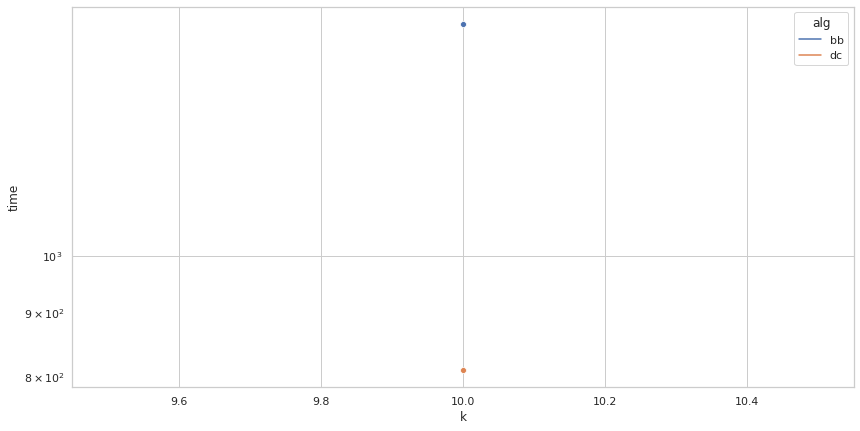

In [592]:
omega = 1.0
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

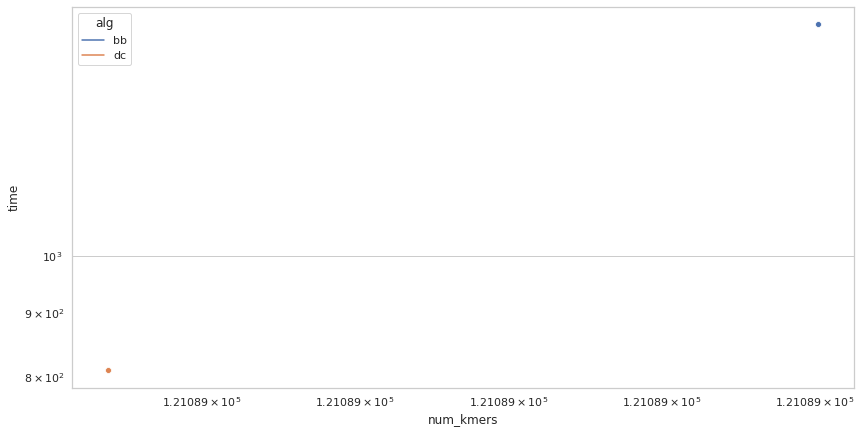

In [593]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

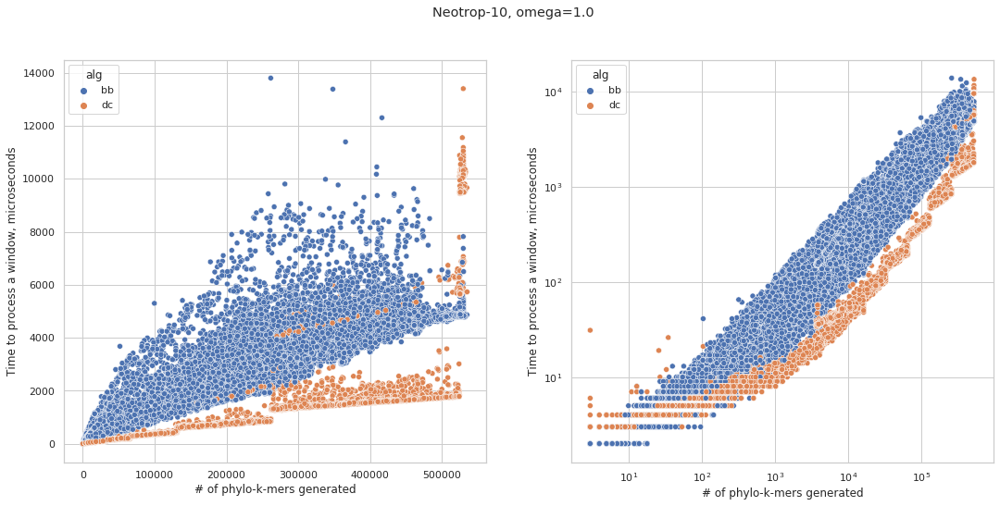

In [594]:
plot(df, omega, f"Neotrop-10, omega={omega}", True)

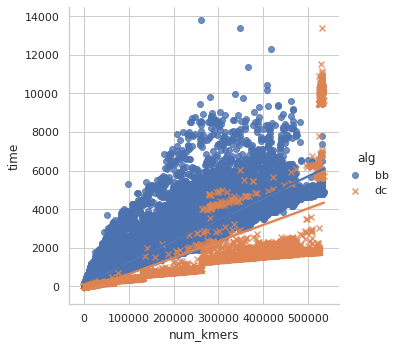

In [595]:
sns.lmplot(data=df, x="num_kmers", y="time", hue="alg", markers=["o", "x"])

In [632]:
df["node"].unique()

array(['Node2251', 'Node2235', 'Node1874', 'Node522', 'Node1596',
       'Node529', 'Node1315', 'Node2404', 'Node580', 'Node935'],
      dtype=object)

In [604]:
dfdc = df[df["alg"] == "dc"]
dfdc[dfdc["time"] > 10000]

,alg,num_kmers,time,k,omega,node,position,avg
22725,dc,529571,10131,10,1,Node1596,134,0.019131
22727,dc,529571,10118,10,1,Node1596,135,0.019106
22729,dc,529571,10109,10,1,Node1596,136,0.019089
22731,dc,529571,10146,10,1,Node1596,137,0.019159
22733,dc,529571,10081,10,1,Node1596,138,0.019036
...,...,...,...,...,...,...,...,...
52615,dc,529612,10150,10,1,Node935,1044,0.019165
52617,dc,528248,10025,10,1,Node935,1045,0.018978
52653,dc,525711,10544,10,1,Node935,1063,0.020057
52917,dc,528265,11548,10,1,Node935,1195,0.021860


In [617]:
dfdc[dfdc["time"] < 2000]

,alg,num_kmers,time,k,omega,node,position,avg
1,dc,105,21,10,1,Node2251,0,0.200000
3,dc,57,9,10,1,Node2251,1,0.157895
5,dc,34,5,10,1,Node2251,2,0.147059
7,dc,34,5,10,1,Node2251,3,0.147059
9,dc,34,8,10,1,Node2251,4,0.235294
...,...,...,...,...,...,...,...,...
56131,dc,10493,60,10,1,Node935,2802,0.005718
56133,dc,14335,65,10,1,Node935,2803,0.004534
56135,dc,18118,96,10,1,Node935,2804,0.005299
56137,dc,18277,83,10,1,Node935,2805,0.004541


## Running time depends on the tree node

For this node, DC shows higher times on k-mer rich regions:

A distant node, branch length ~16. Close to two leafs.

In [637]:
df["position"].max()

2806

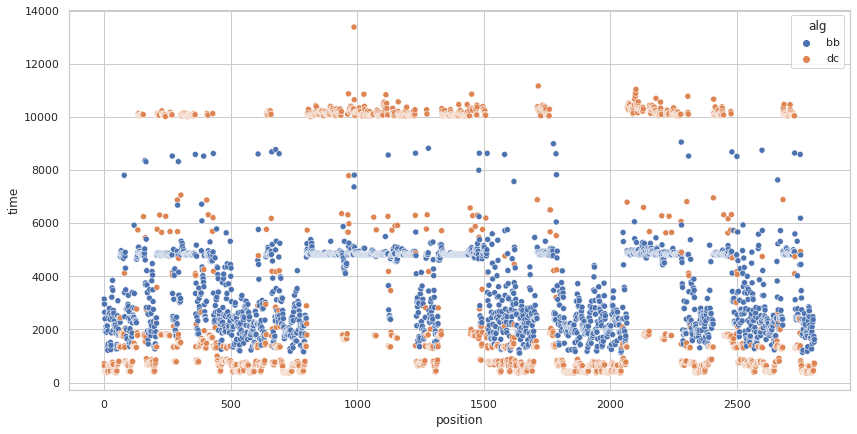

In [633]:
node = "Node1596"
dfnode = df[df["node"] == node]
sns.scatterplot(data=dfnode, x="position", y="time", hue="alg")

/home/nikolai/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


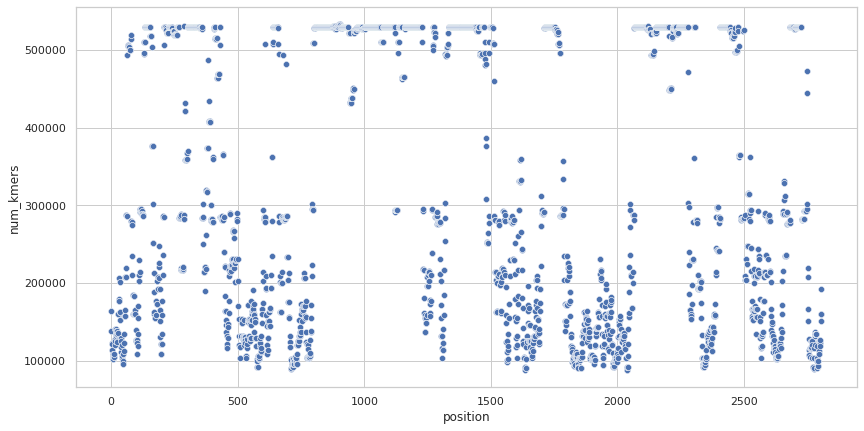

In [634]:
sns.scatterplot(dfnode["position"], dfnode["num_kmers"])

**The picture above concides very accurately with the percentage identity of columns of the alignment**.

1) High variety and many gaps => high number of k-mers and higher time of DC
1) Conservative regions => low number of k-mers and lower time of DC

Let us look at another example. Almost the root node, branch length 0.19. The situation is the opposite: for k-mer rich regions BB shows higher time than DC.

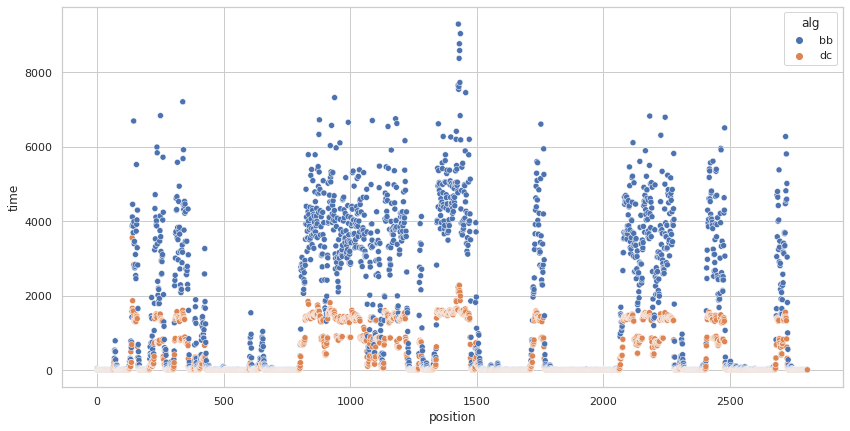

In [630]:
node = "Node2251"
dfnode = df[df["node"] == node]
sns.scatterplot(data=dfnode, x="position", y="time", hue="alg")

/home/nikolai/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


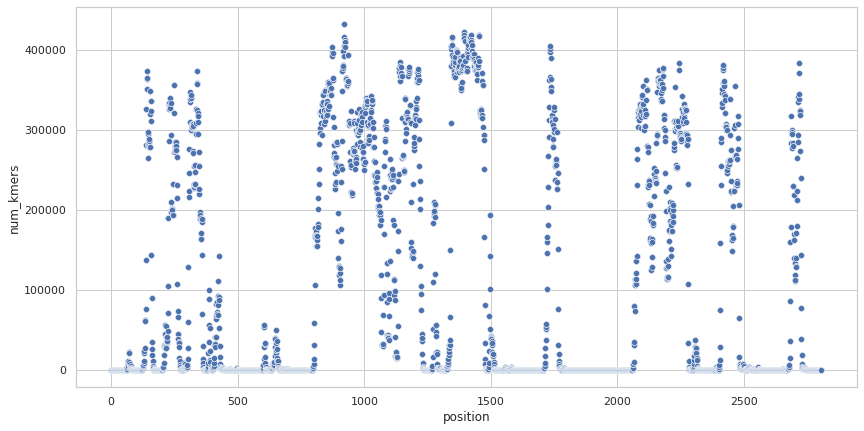

In [629]:
sns.scatterplot(dfnode["position"], dfnode["num_kmers"])

Almost the root node:

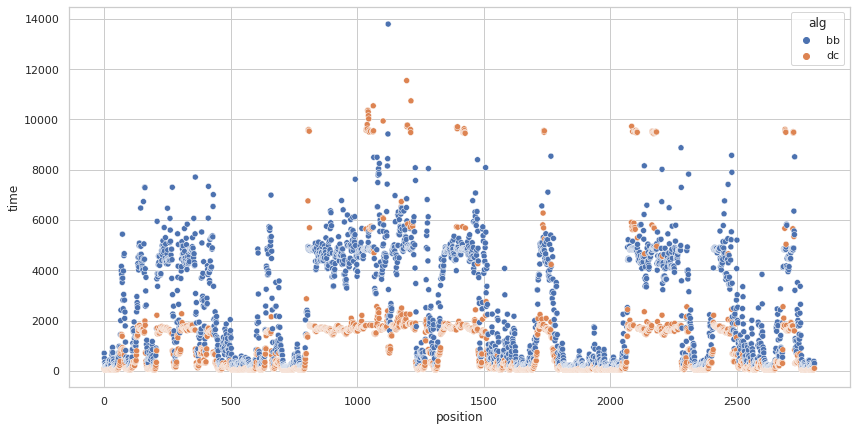

In [635]:
node = "Node935"
dfnode = df[df["node"] == node]
sns.scatterplot(data=dfnode, x="position", y="time", hue="alg")

/home/nikolai/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


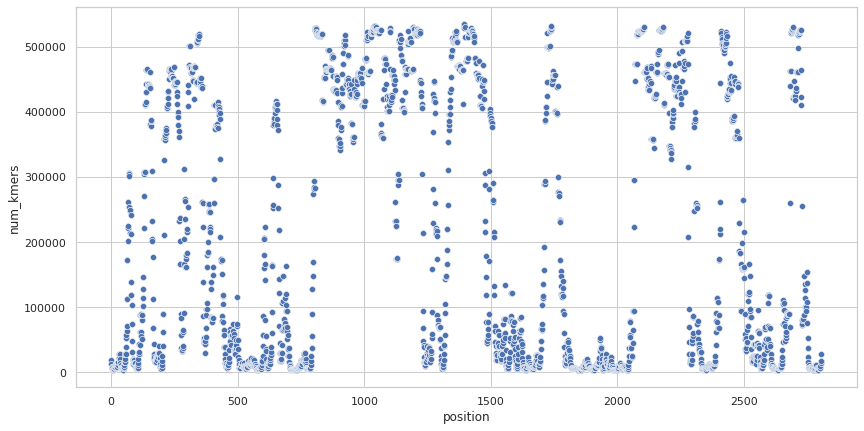

In [636]:
sns.scatterplot(dfnode["position"], dfnode["num_kmers"])

## More nodes

In [776]:
df = pd.read_csv("results/neotrop-random-100.csv")
df["time"] += 1
df["num_kmers"] += 1
df["avg"] = df["time"] / df["num_kmers"]
#df = df[df["k"] == 10]

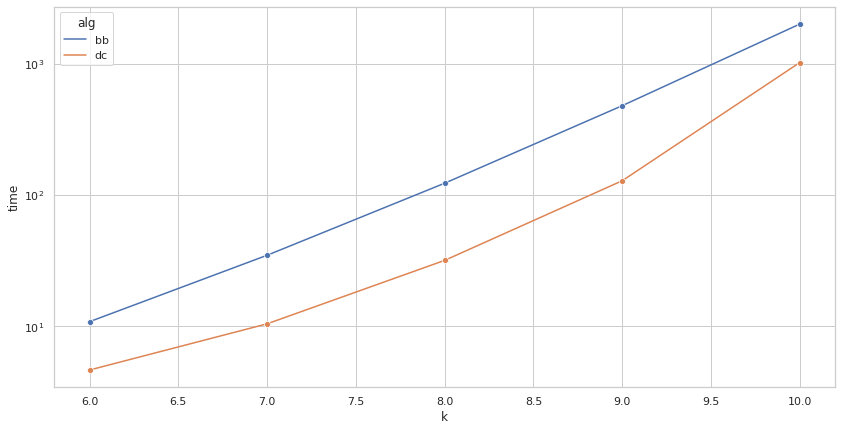

In [777]:
omega = 1.0
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

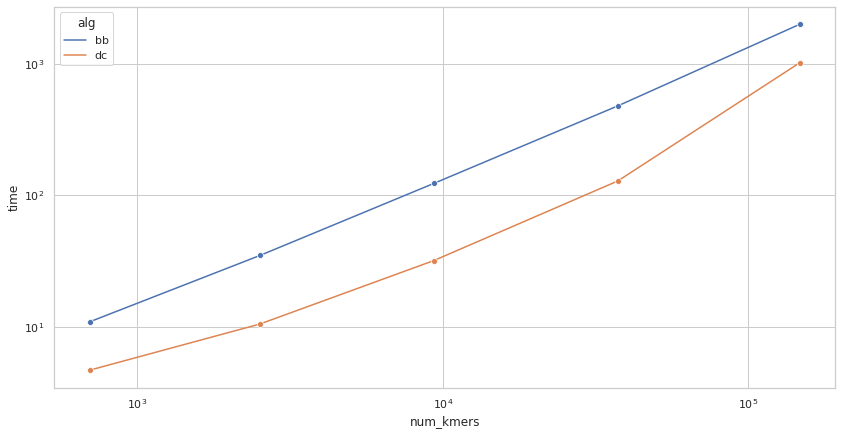

In [778]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

In [790]:
#omega = 1.0
#plot(df[df["k"] == 10], omega, f"Neotrop-100, omega={omega}", True)

In [793]:
dfg = df.groupby(['num_kmers', 'k', 'omega', 'alg']).mean().reset_index()
dfg

,num_kmers,k,omega,alg,time,position,avg
0,2,6,1,bb,1.000958,1449.885221,0.500479
1,2,6,1,dc,1.048744,1449.885221,0.524372
2,2,7,1,bb,1.002988,1453.582609,0.501494
3,2,7,1,dc,1.371537,1453.582609,0.685769
4,2,8,1,bb,1.002516,1472.979166,0.501258
...,...,...,...,...,...,...,...
469328,543018,10,1,dc,7336.000000,1039.000000,0.013510
469329,544091,10,1,bb,7353.000000,1040.000000,0.013514
469330,544091,10,1,dc,7327.000000,1040.000000,0.013466
469331,545261,10,1,bb,7349.000000,1041.000000,0.013478


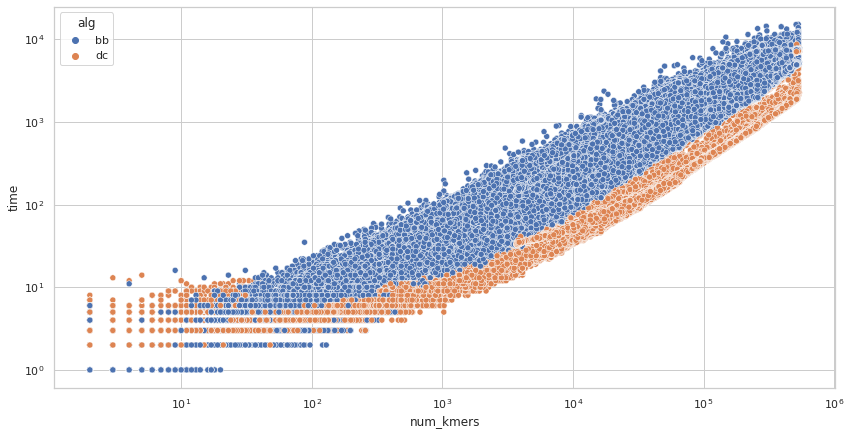

In [822]:
k = 10
g = sns.scatterplot(data=df[df["k"] == k], x='num_kmers', y='time', hue='alg')
g.set_yscale("log")
g.set_xscale("log")

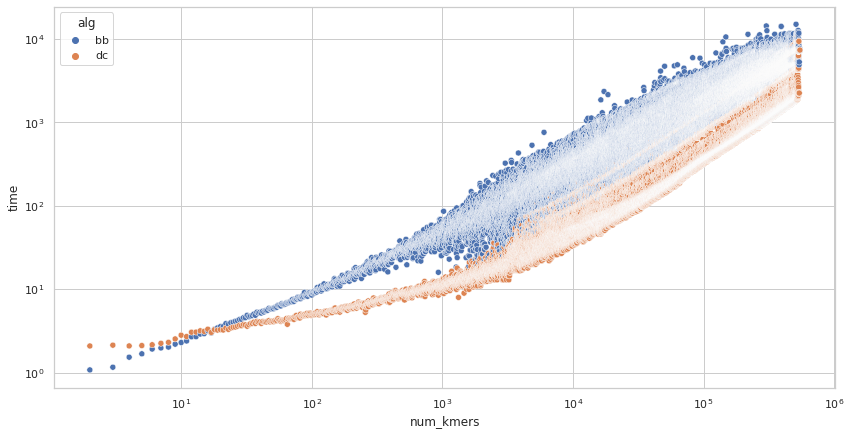

In [821]:
k = 10
dfg = df[df["k"] == k].groupby(['num_kmers', 'alg']).mean().reset_index()
#dfg
g = sns.scatterplot(data=dfg, x='num_kmers', y='time', hue='alg')
g.set_yscale("log")
g.set_xscale("log")

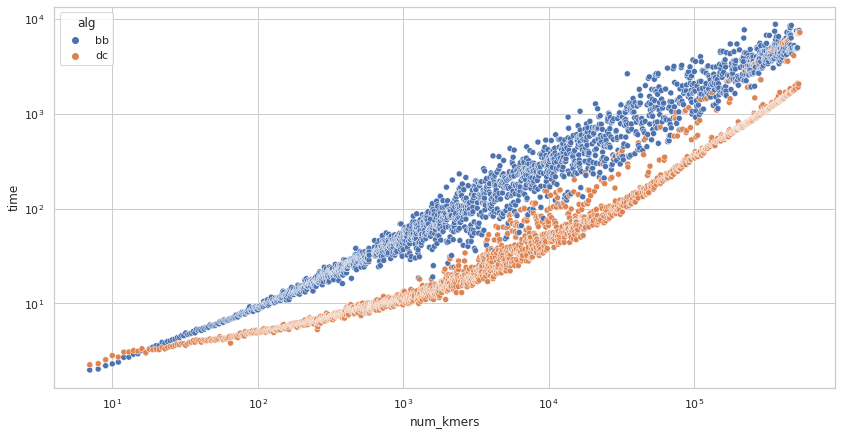

In [836]:
space = np.logspace(1, 6, num=7000)
rarefied = dfg[dfg.index.isin(space)]

g = sns.scatterplot(data=rarefied, x='num_kmers', y='time', hue='alg')
g.set_yscale("log")
g.set_xscale("log")

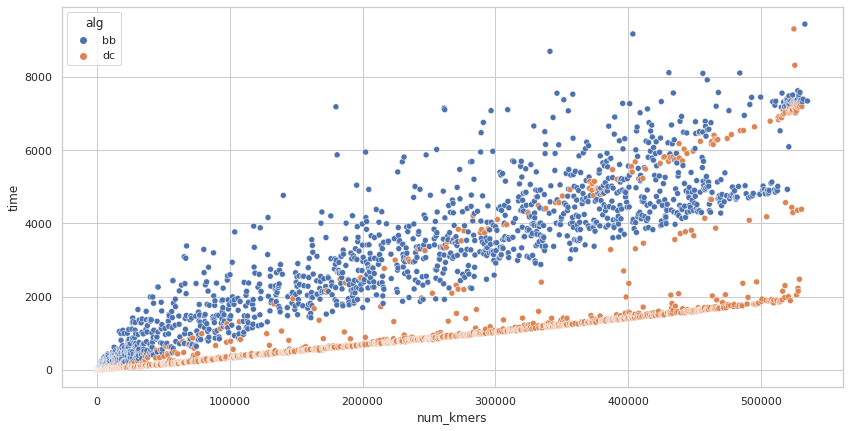

In [838]:
space = np.linspace(0, df["num_kmers"].max(), num=7000)
rarefied = dfg[dfg.index.isin(space)]
g = sns.scatterplot(data=rarefied, x='num_kmers', y='time', hue='alg')
#g.set_yscale("log")
#g.set_xscale("log")

In [795]:
dfg = df.groupby(['node', 'alg', 'k']).mean().reset_index()
dfg

,node,alg,k,num_kmers,time,omega,position,avg
0,Node1031,bb,6,351.317325,7.318036,1.0,1405.0,0.206678
1,Node1031,bb,7,1277.805338,22.050178,1.0,1404.5,0.159319
2,Node1031,bb,8,4680.529014,73.450338,1.0,1404.0,0.134227
3,Node1031,bb,9,17239.722222,258.565883,1.0,1403.5,0.116690
4,Node1031,bb,10,63729.996081,936.681154,1.0,1403.0,0.098683
...,...,...,...,...,...,...,...,...
995,Node975,dc,6,338.456421,3.184988,1.0,1405.0,0.277433
996,Node975,dc,7,1232.849822,6.467616,1.0,1404.5,0.386390
997,Node975,dc,8,4520.139907,17.363119,1.0,1404.0,0.424068
998,Node975,dc,9,16654.678063,55.852564,1.0,1403.5,0.383743


In [796]:
df_time = df.pivot_table(index=['node', 'k', 'position'], columns='alg', values='time').reset_index()#.drop(["alg"], axis=1)
df_time

alg,node,k,position,bb,dc
0,Node1031,6,0,4,3
1,Node1031,6,1,3,2
2,Node1031,6,2,2,2
3,Node1031,6,3,2,2
4,Node1031,6,4,2,2
...,...,...,...,...,...
1404495,Node975,10,2802,1,2
1404496,Node975,10,2803,1,2
1404497,Node975,10,2804,2,2
1404498,Node975,10,2805,1,3


In [797]:
len(df_time[df_time["bb"] > df_time["dc"]]) / len(df_time)

0.6816375934496262

In [798]:
bad = df_time[df_time["bb"] < df_time["dc"]]
len(bad["node"].unique()), bad["node"].unique()

(98,
 array(['Node1031', 'Node1034', 'Node1035', 'Node1059', 'Node1126',
        'Node1195', 'Node1196', 'Node1197', 'Node1222', 'Node1227',
        'Node124', 'Node1270', 'Node129', 'Node1292', 'Node1314',
        'Node1347', 'Node1402', 'Node147', 'Node1537', 'Node1540',
        'Node1546', 'Node1560', 'Node1580', 'Node1590', 'Node1612',
        'Node1631', 'Node1683', 'Node1705', 'Node1706', 'Node171',
        'Node1714', 'Node1730', 'Node174', 'Node1743', 'Node1746',
        'Node1769', 'Node1876', 'Node1877', 'Node1878', 'Node190',
        'Node1902', 'Node1910', 'Node1924', 'Node1938', 'Node1939',
        'Node1940', 'Node1945', 'Node1971', 'Node2013', 'Node2071',
        'Node208', 'Node2086', 'Node2122', 'Node214', 'Node2152',
        'Node216', 'Node2168', 'Node2217', 'Node2271', 'Node2290',
        'Node2330', 'Node2355', 'Node236', 'Node2388', 'Node2401',
        'Node241', 'Node2432', 'Node2452', 'Node2471', 'Node248',
        'Node2481', 'Node2491', 'Node2552', 'Node346', 

In [799]:
df_mean_time = df.groupby(['node', 'k', 'alg']).mean().pivot_table(index=['node', 'k', 'position'], columns='alg', values='time').reset_index()
df_mean_time

alg,node,k,position,bb,dc
0,Node1031,6,1405.0,7.318036,3.313412
1,Node1031,7,1404.5,22.050178,6.704626
2,Node1031,8,1404.0,73.450338,17.889996
3,Node1031,9,1403.5,258.565883,56.557336
4,Node1031,10,1403.0,936.681154,224.820805
...,...,...,...,...,...
495,Node975,6,1405.0,7.068659,3.184988
496,Node975,7,1404.5,21.178648,6.467616
497,Node975,8,1404.0,71.393734,17.363119
498,Node975,9,1403.5,253.377849,55.852564


In [801]:
bad = df_mean_time[df_mean_time["bb"] < df_mean_time["dc"]].node.unique()
bad, len(bad)

(array([], dtype=object), 0)

In [802]:
good = df_mean_time[df_mean_time["bb"] >= df_mean_time["dc"]].node.unique()
good, len(good)

(array(['Node1031', 'Node1034', 'Node1035', 'Node1059', 'Node1126',
        'Node1195', 'Node1196', 'Node1197', 'Node1222', 'Node1227',
        'Node124', 'Node1270', 'Node129', 'Node1292', 'Node1314',
        'Node1347', 'Node1402', 'Node147', 'Node1537', 'Node1540',
        'Node1546', 'Node1560', 'Node1580', 'Node1590', 'Node1612',
        'Node1631', 'Node1683', 'Node1705', 'Node1706', 'Node171',
        'Node1714', 'Node1730', 'Node174', 'Node1743', 'Node1746',
        'Node1769', 'Node1876', 'Node1877', 'Node1878', 'Node190',
        'Node1902', 'Node1910', 'Node1924', 'Node1938', 'Node1939',
        'Node1940', 'Node1945', 'Node1971', 'Node2013', 'Node2071',
        'Node208', 'Node2086', 'Node2122', 'Node2129', 'Node214',
        'Node2152', 'Node216', 'Node2168', 'Node2217', 'Node2271',
        'Node2290', 'Node2330', 'Node2355', 'Node236', 'Node2388',
        'Node2401', 'Node241', 'Node2432', 'Node2452', 'Node2471',
        'Node248', 'Node2481', 'Node2491', 'Node2552', 'Nod

In [803]:
def node_plot(df, k, node, yarg="time", position_range=None):
    dfnode = df[(df["k"] == k) & (df["node"] == node)]
    plt.figure(figsize = (30,8))
    
    if position_range:
        dfpos = dfnode[dfnode["position"].between(*position_range)]
    else:
        dfpos = dfnode
    sns.scatterplot(data=dfpos, x="position", y=yarg, hue="alg").set(title=f"Node {node}")
    
    
    

In [805]:
node = bad[0]
k = 10
node_plot(df, k, node, "time", [800, 1000])
#node_plot(df, k, node)

IndexError: index 0 is out of bounds for axis 0 with size 0

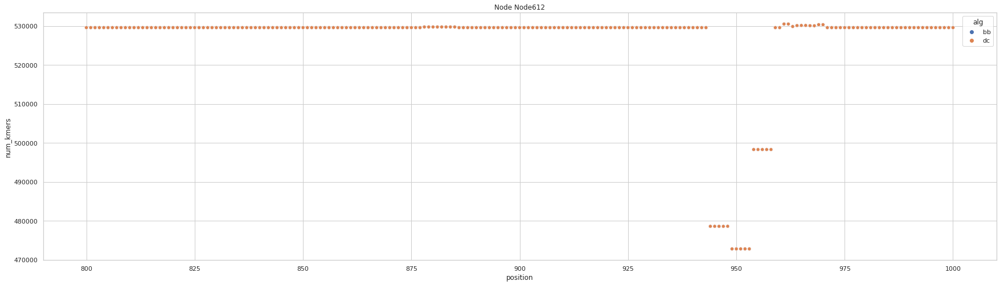

In [775]:
node_plot(df, k, node, "num_kmers", [800, 1000])

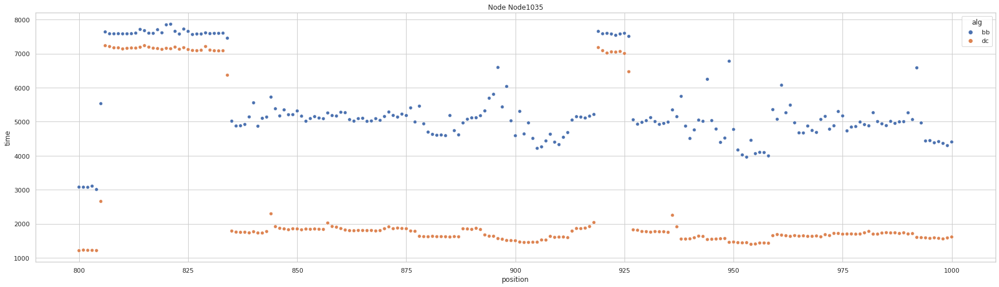

In [808]:
node = good[2]

node_plot(df, k, node, "time", [800, 1000])

# D155 (HCV)

In [33]:
df = pd.read_csv("results/d155-random-10.csv")
df["time"] += 1
df["num_kmers"] += 1
k = 10

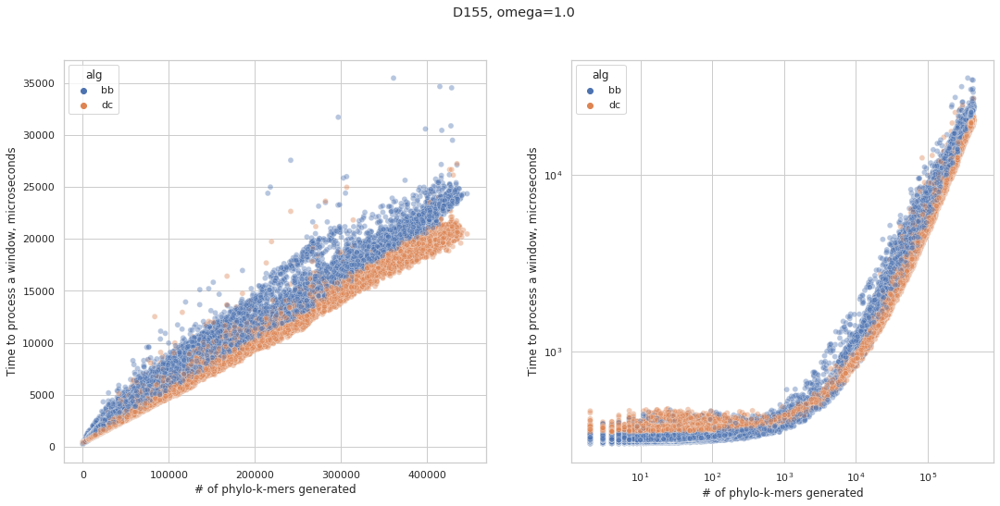

In [37]:
omega = 1.0
plot(df, omega, f"D155, omega={omega}", alpha=0.4)

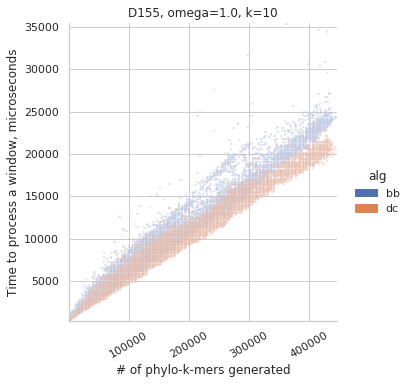

In [38]:
kde(df, omega, f"D155, omega={omega}, k={k}", alpha=0.4)

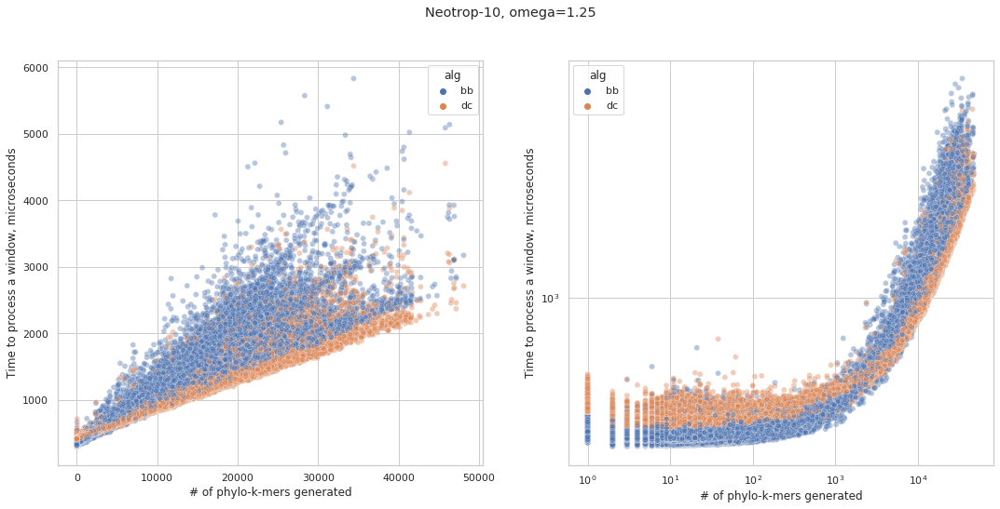

In [39]:
omega = 1.25
plot(df, omega, f"Neotrop-10, omega={omega}", alpha=0.4)

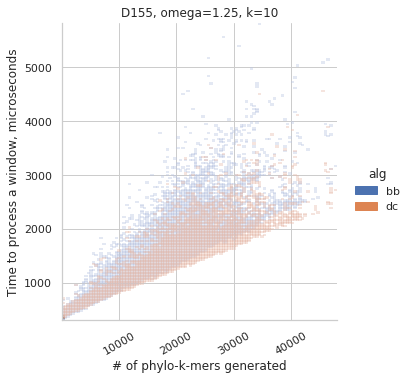

In [40]:
kde(df, omega, f"D155, omega={omega}, k={k}", alpha=0.4)

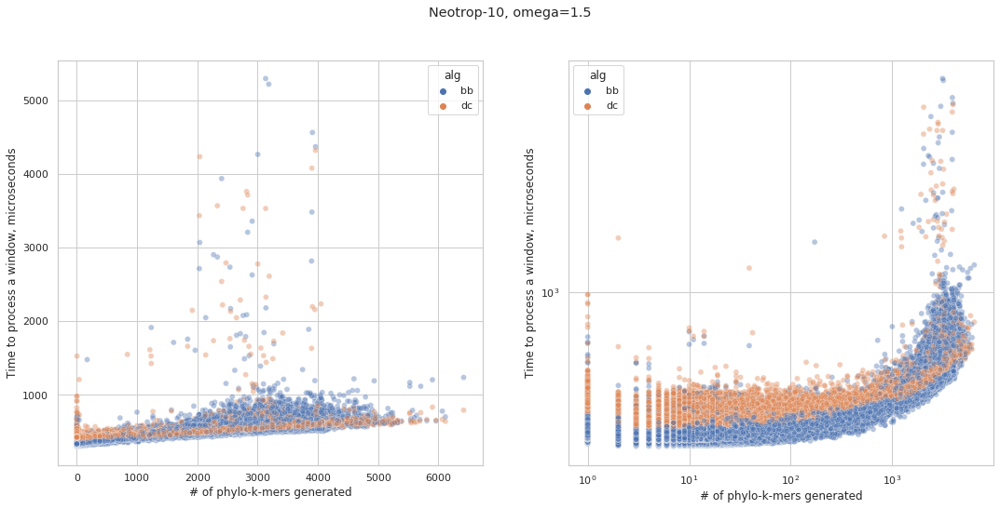

In [44]:
omega = 1.5
plot(df, omega, f"Neotrop-10, omega={omega}", alpha=0.4)

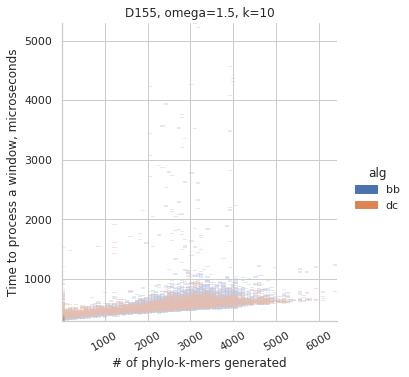

In [45]:
kde(df, omega, f"D155, omega={omega}, k={k}", alpha=0.4)

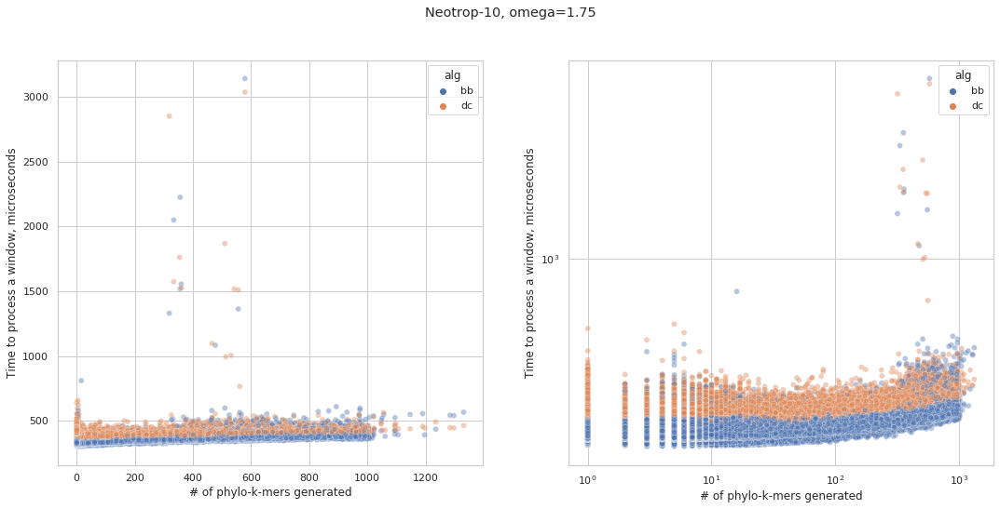

In [46]:
omega = 1.75
plot(df, omega, f"Neotrop-10, omega={omega}", alpha=0.4)

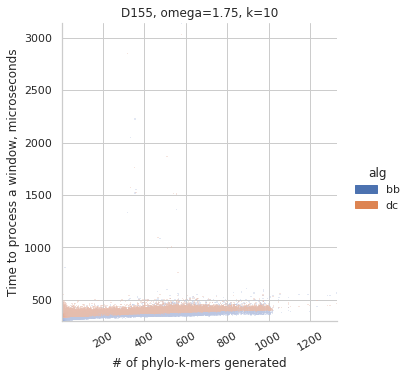

In [47]:
kde(df, omega, f"D155, omega={omega}, k={k}", alpha=0.4)

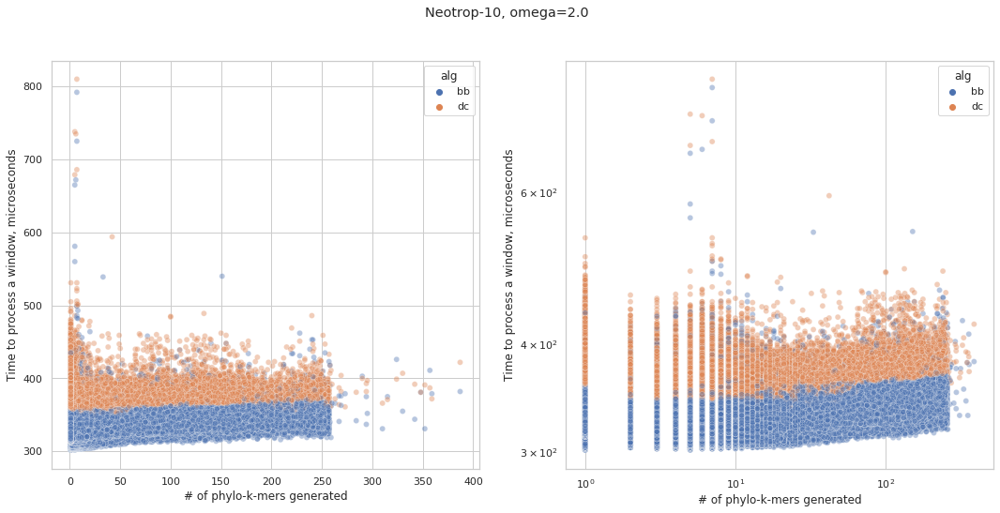

In [48]:
omega = 2.0
plot(df, omega, f"Neotrop-10, omega={omega}", alpha=0.4)

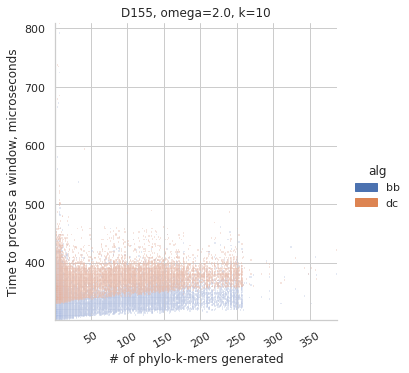

In [49]:
kde(df, omega, f"D155, omega={omega}, k={k}", alpha=0.4)

## Random data

In [845]:
#df = pd.read_csv("results/random-k10.csv")
df = pd.read_csv("results/random-o1.csv")
df["time"] += 1
df["num_kmers"] += 1
df["avg"] = df["time"] / df["num_kmers"]

In [840]:
#df = pd.read_csv("results/random-new-dc.csv")
#df = pd.read_csv("results/random-new-dc-k10.csv")
#df = pd.read_csv("results/random-new-dc-k10-test2.csv")
#df["time"] += 1
#df["num_kmers"] += 1

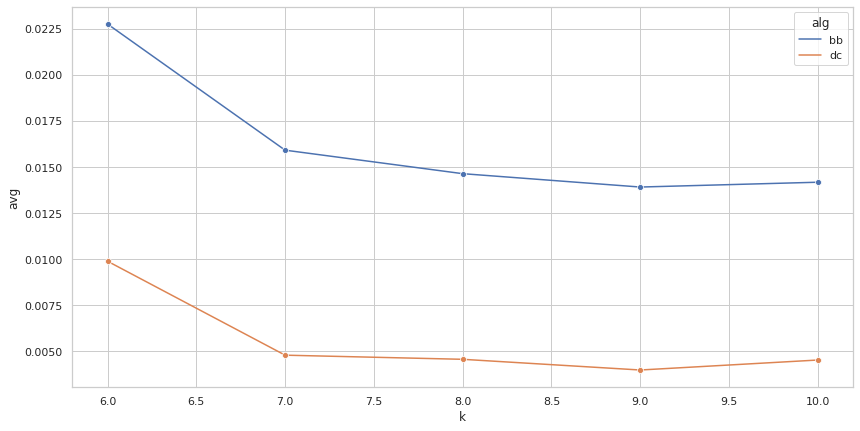

In [846]:
omega = 1.0
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
dfg["avg"] = dfg["time"] / dfg["num_kmers"]
g = sns.lineplot(data=dfg, x="k", y="avg", hue="alg", marker='o')
#g.set_yscale("log")
#g.set_xscale("log")

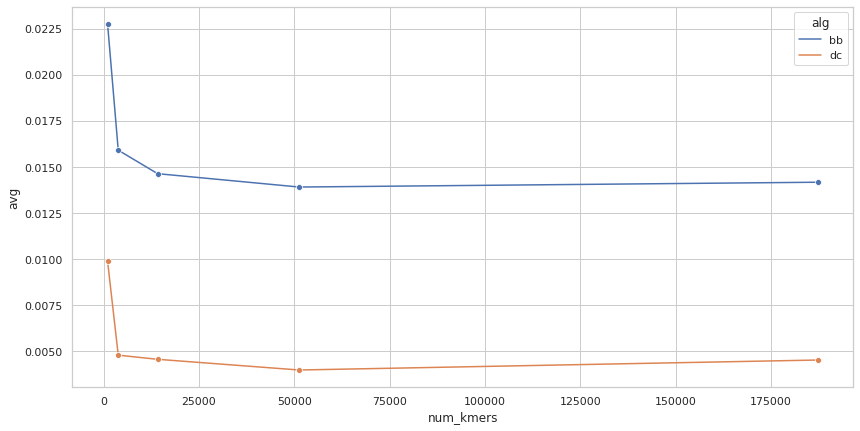

In [847]:
g = sns.lineplot(data=dfg, x="num_kmers", y="avg", hue="alg", marker='o')

In [518]:
df = pd.read_csv("results/random-new-dc-k10.csv")
df["time"] += 1
df["num_kmers"] += 1
df["avg"] = df["time"] / df["num_kmers"]

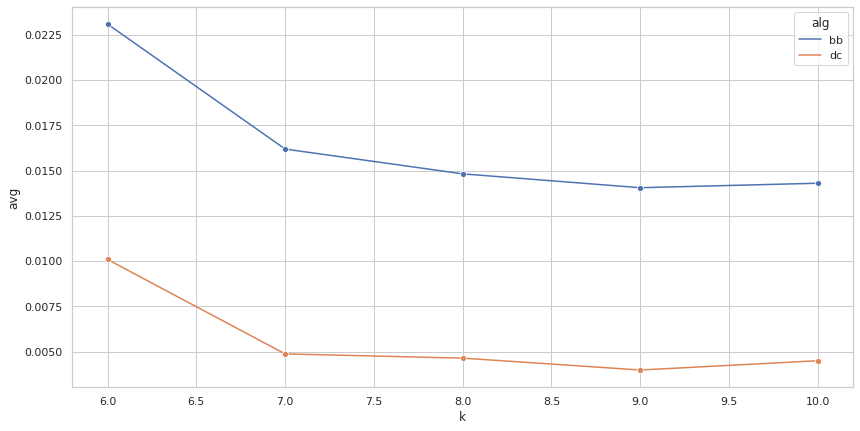

In [848]:
omega = 1.0
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
#dfg["avg"] = dfg["time"] / dfg["num_kmers"]
g = sns.lineplot(data=dfg, x="k", y="avg", hue="alg", marker='o')

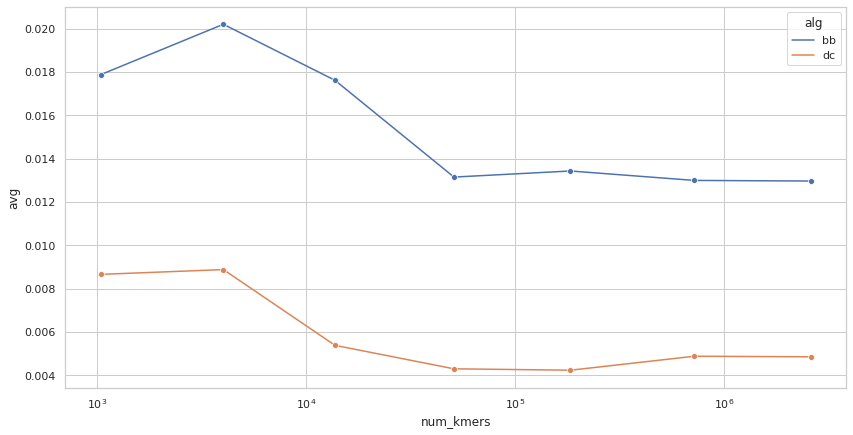

In [516]:
g = sns.lineplot(data=dfg, x="num_kmers", y="avg", hue="alg", marker='o')
g.set_xscale("log")

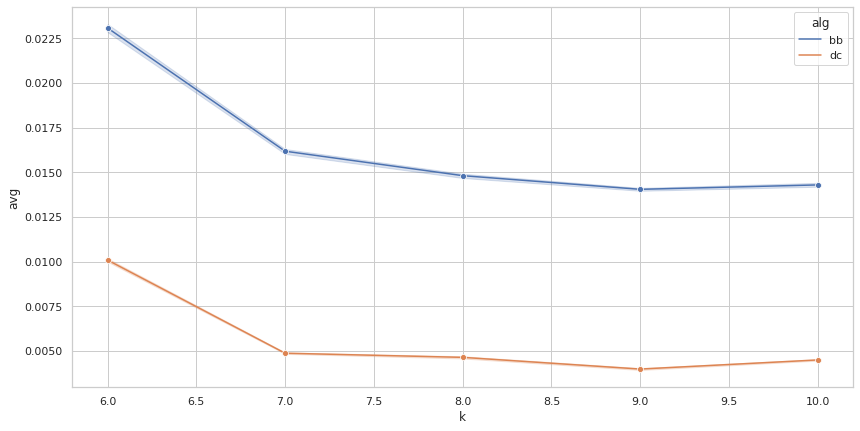

In [849]:
g = sns.lineplot(data=df, x="k", y="avg", hue="alg", marker='o')

In [844]:
g = sns.lineplot(data=df, x="num_kmers", y="avg", hue="alg", marker='o')
g.set_xscale("log")

ValueError: Could not interpret value `avg` for parameter `y`

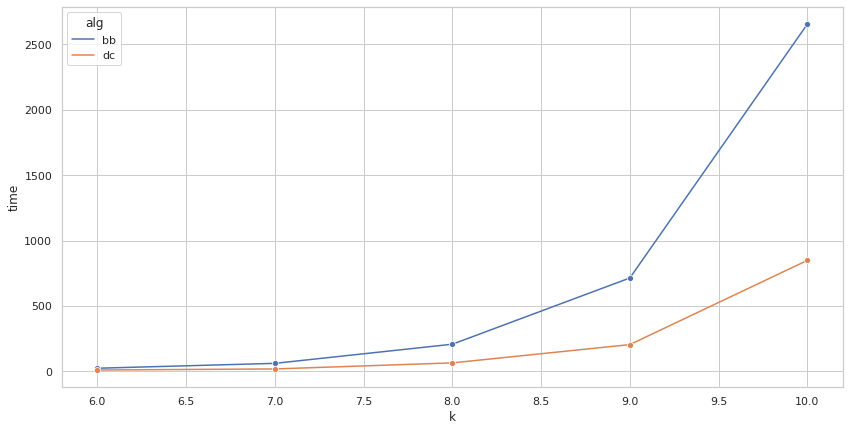

In [850]:
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')

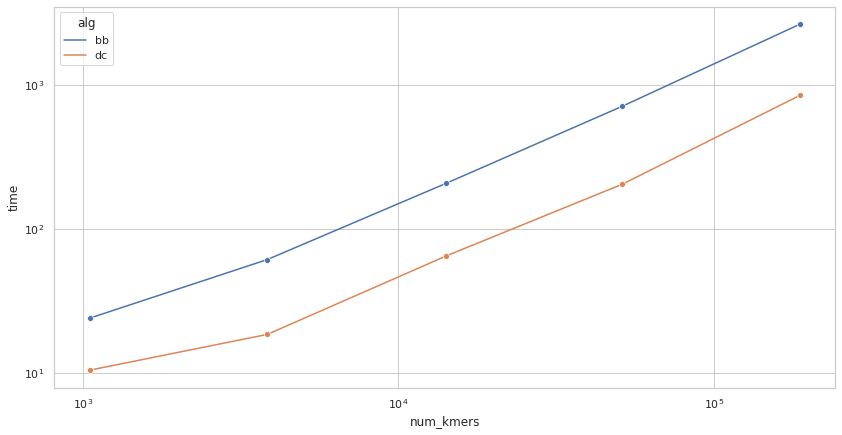

In [851]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

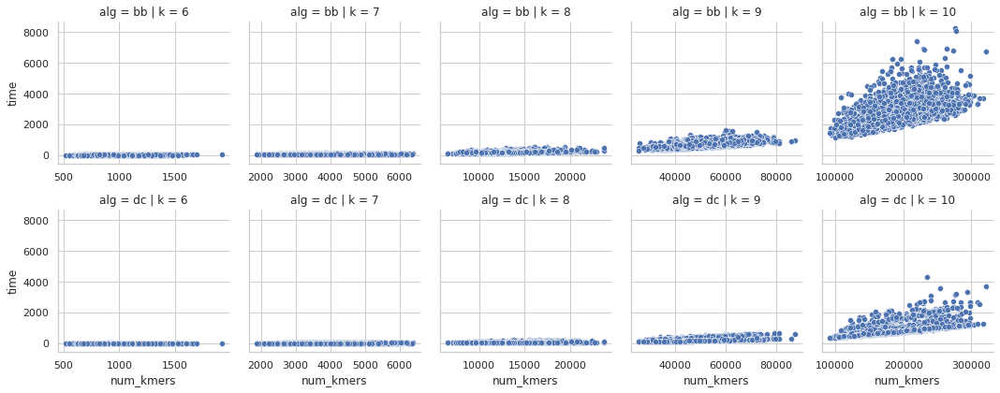

In [852]:
#g = sns.catplot(data=df, row="k", col="alg", x="num_kmers", y="time", hue="alg")
#g.set_yscale("log")
#g.set_xscale("log")

g = sns.FacetGrid(dfo, col="k", row="alg", sharex=False, sharey=True)
g.map(sns.scatterplot, "num_kmers", "time")#.set(yscale = 'log')

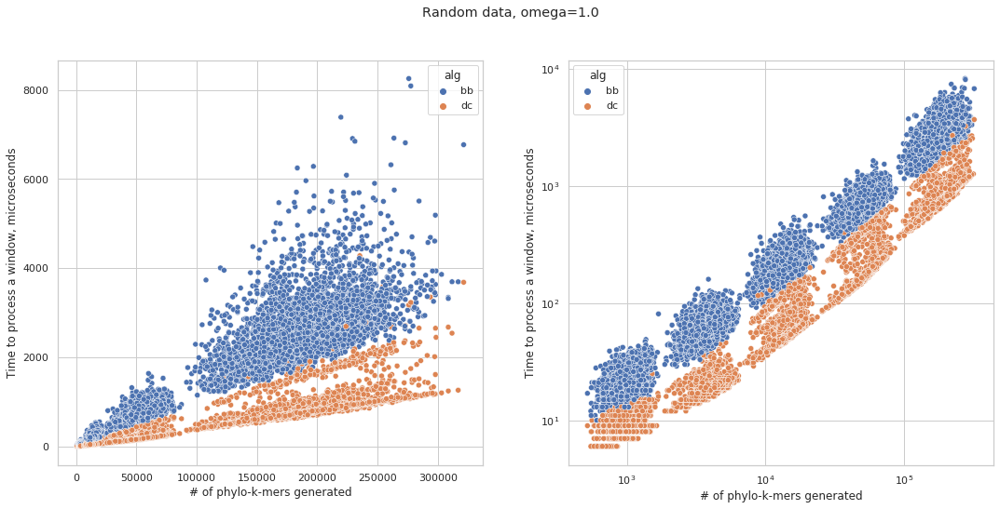

In [853]:
plot(df, omega, f"Random data, omega={omega}", True)

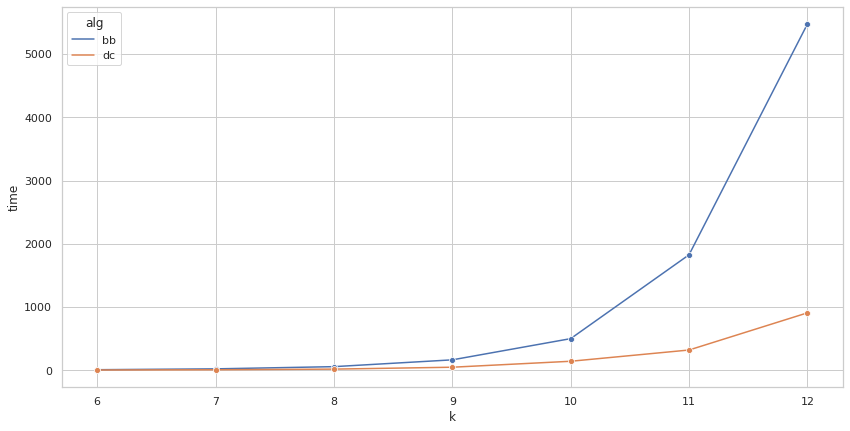

In [454]:
omega = 1.25
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
#g.set_yscale("log")
#g.set_xscale("log")

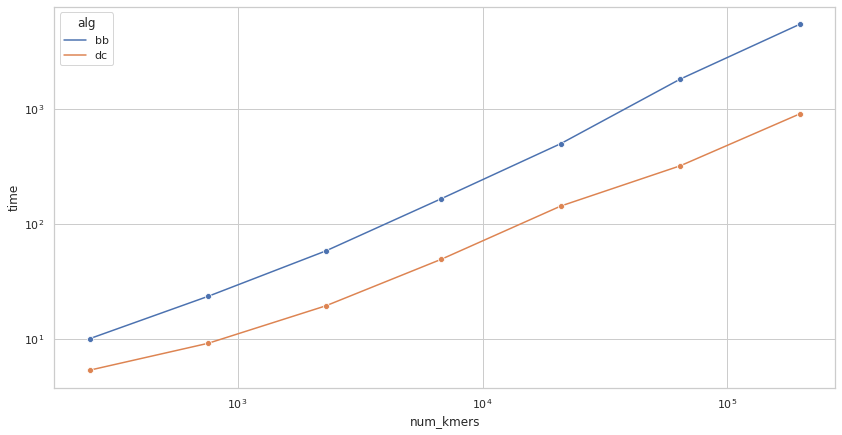

In [455]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

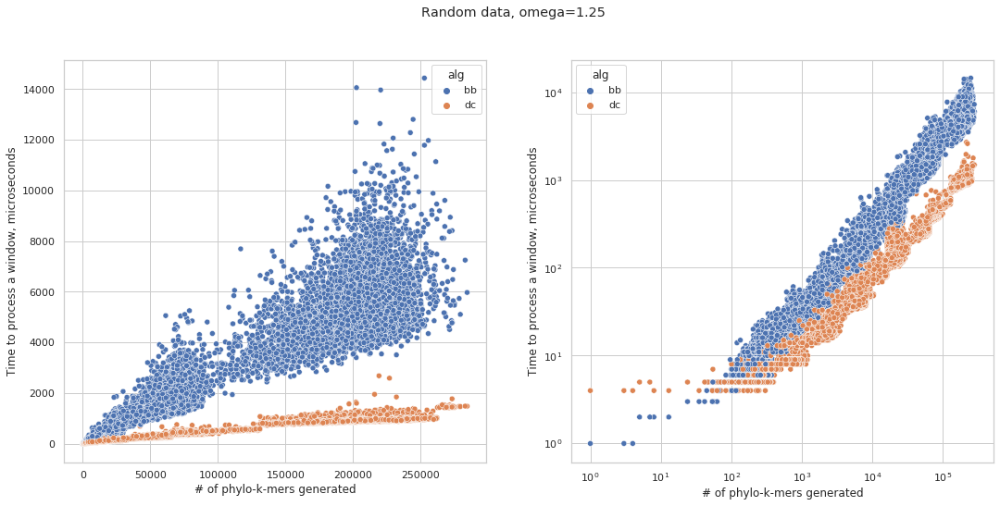

In [456]:
plot(df, omega, f"Random data, omega={omega}", True)

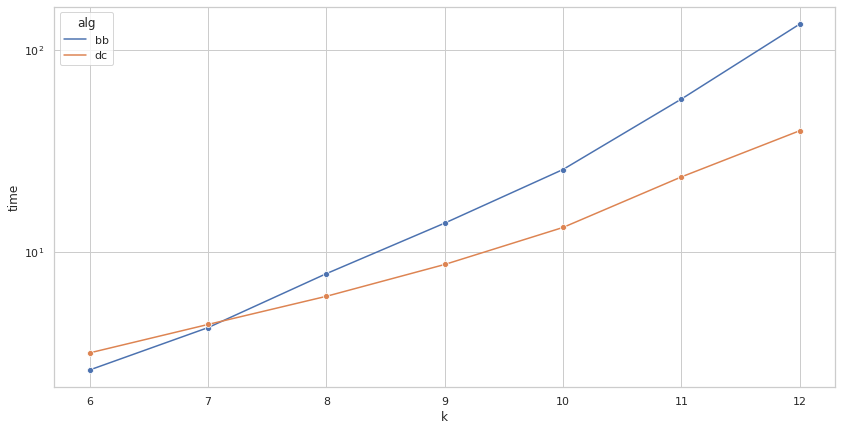

In [457]:
omega = 1.5
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

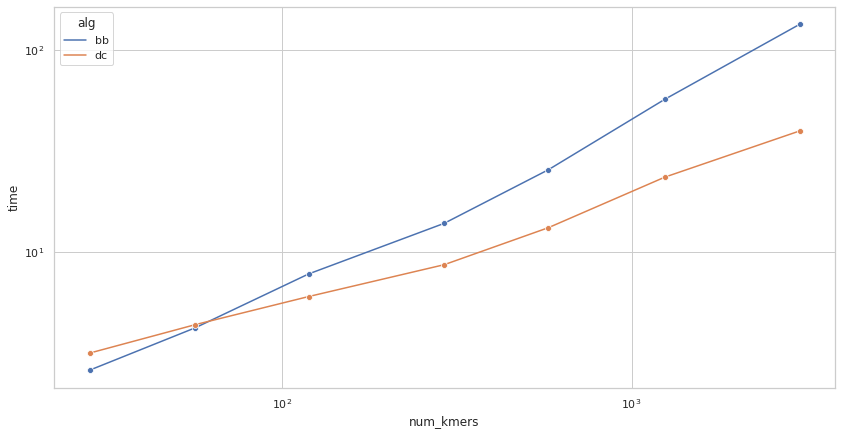

In [458]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

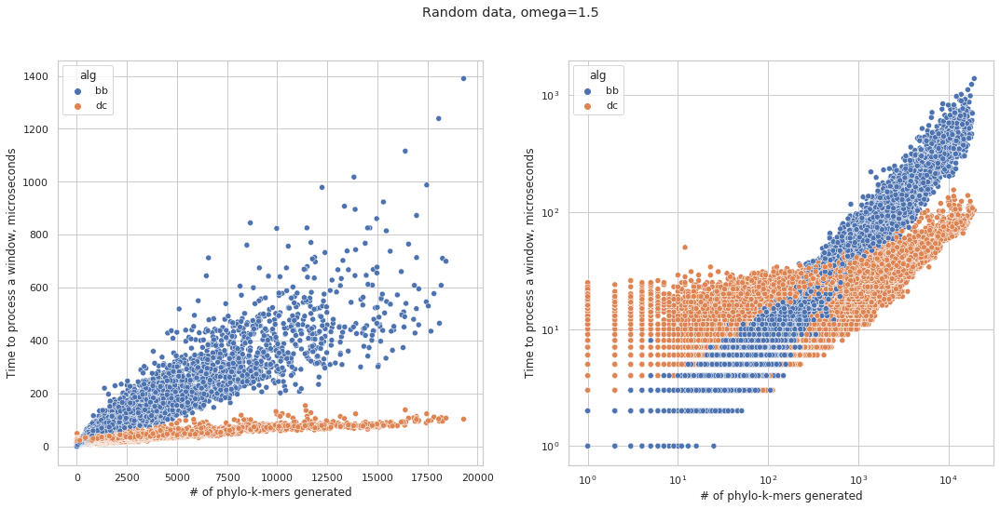

In [459]:
plot(df, omega, f"Random data, omega={omega}", True)

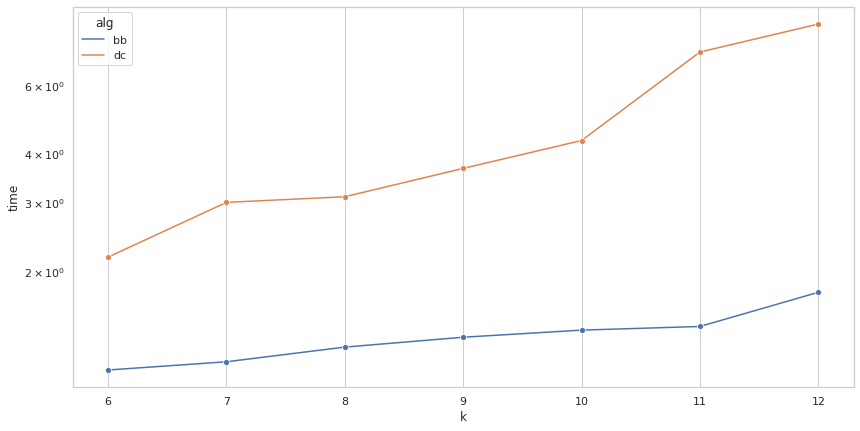

In [385]:
omega = 1.75
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

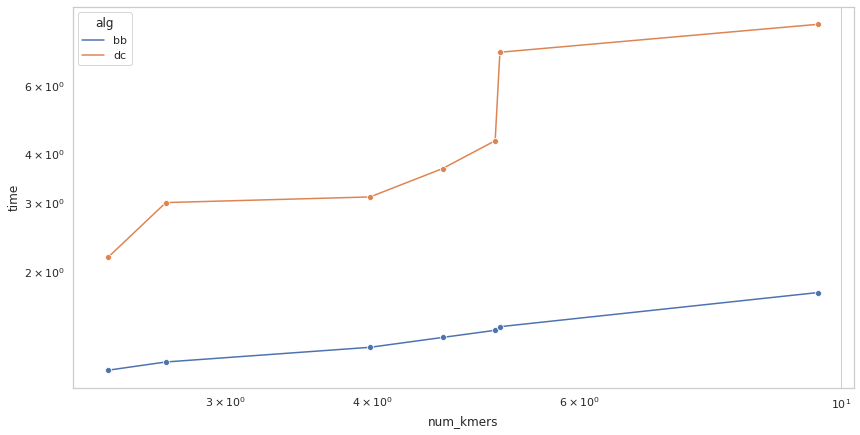

In [386]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

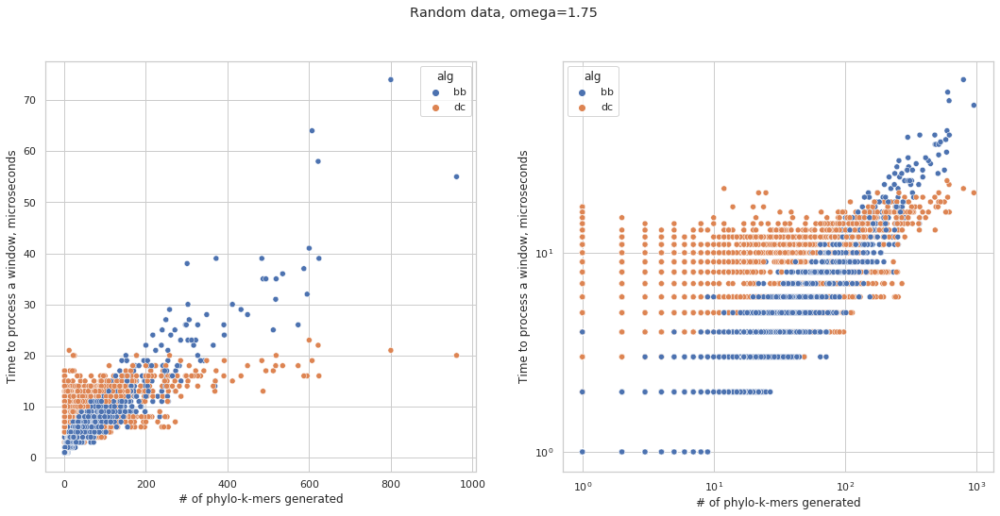

In [387]:
plot(df, omega, f"Random data, omega={omega}", True)

In [263]:
df = pd.read_csv("results/random.csv")
df["time"] += 1
df["num_kmers"] += 1

In [360]:
dfg

,omega,k,alg,num_kmers,time,ratio
0,1.75,6,bb,2.900000,1.179167,7.080078e-04
1,1.75,6,dc,2.900000,2.437500,7.080078e-04
2,1.75,7,bb,2.075000,1.128571,1.266479e-04
3,1.75,7,dc,2.075000,2.703571,1.266479e-04
4,1.75,8,bb,6.553125,1.493750,9.999275e-05
5,1.75,8,dc,6.553125,3.100000,9.999275e-05
6,1.75,9,bb,6.469444,1.483333,2.467897e-05
7,1.75,9,dc,6.469444,3.677778,2.467897e-05
8,1.75,10,bb,4.160000,1.402500,3.967285e-06
9,1.75,10,dc,4.160000,4.385000,3.967285e-06


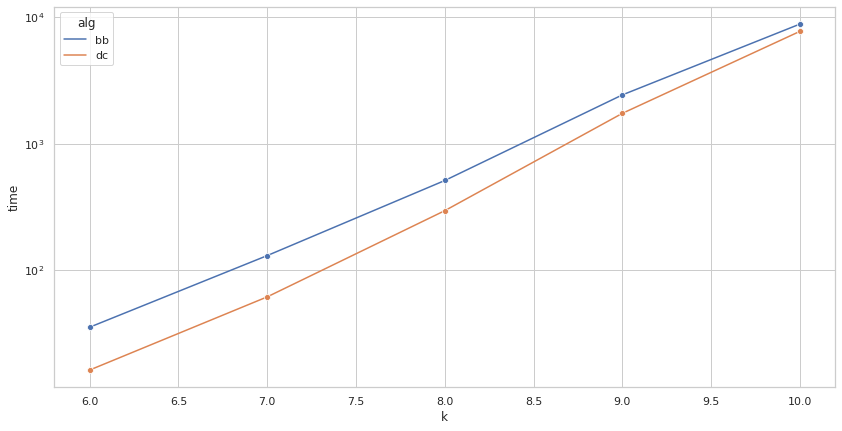

In [264]:
omega = 1.0
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

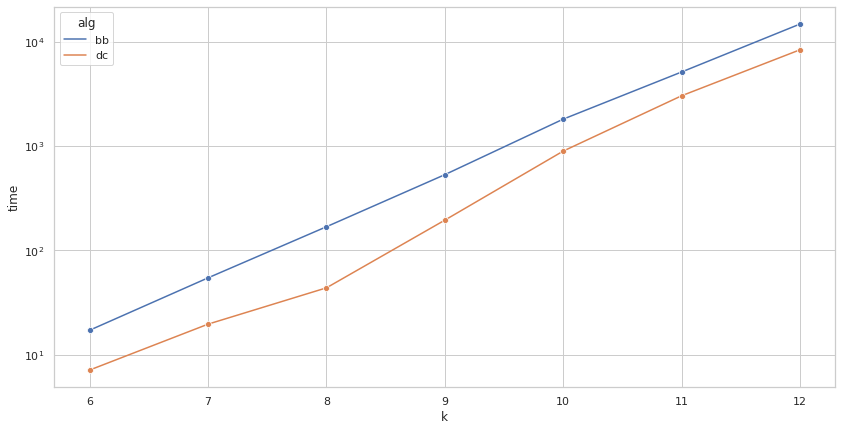

In [265]:
omega = 1.25
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

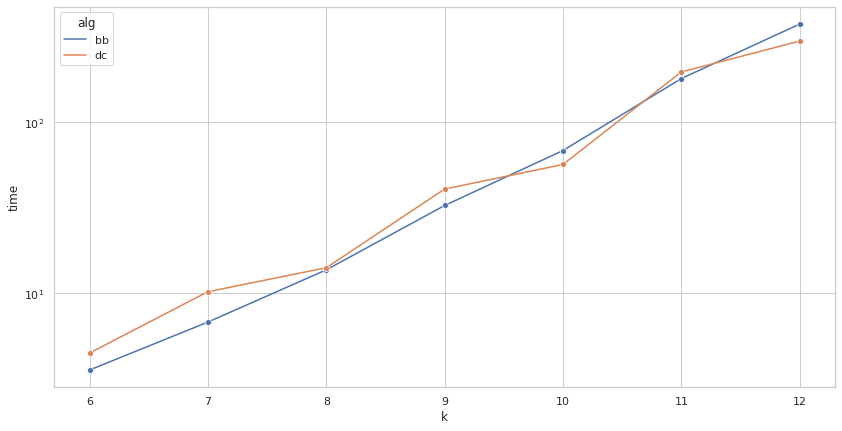

In [266]:
omega = 1.5
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()

dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

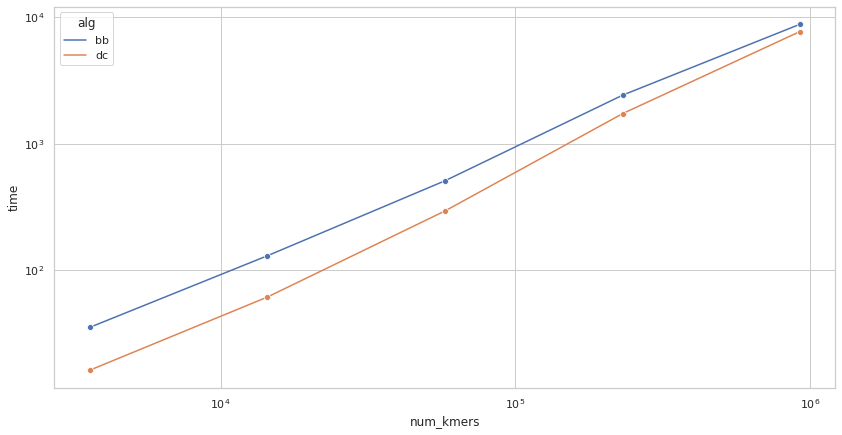

In [245]:
g = sns.lineplot(data=dfg, x="num_kmers", y="time", hue="alg", marker='o')
g.set_yscale("log")
g.set_xscale("log")

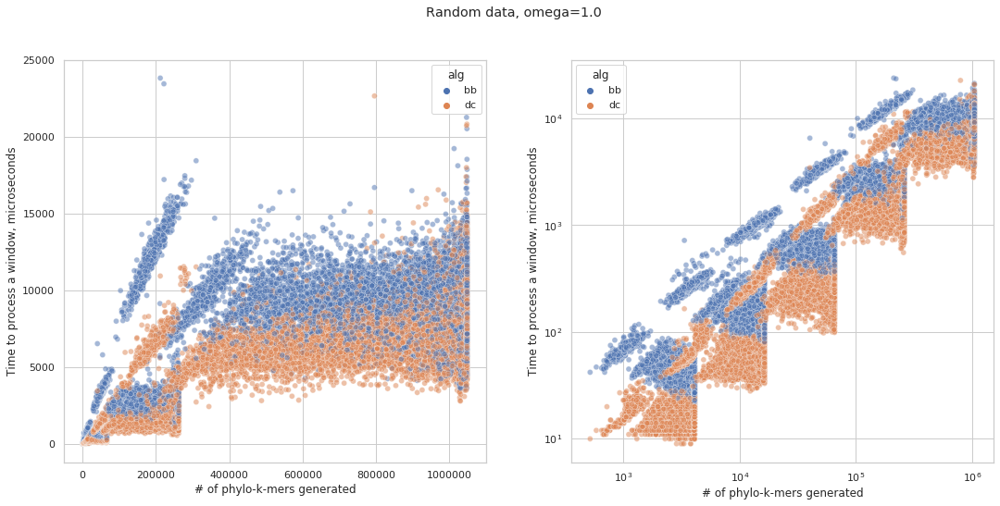

In [114]:
omega = 1.0
plot(df, omega, f"Random data, omega={omega}")

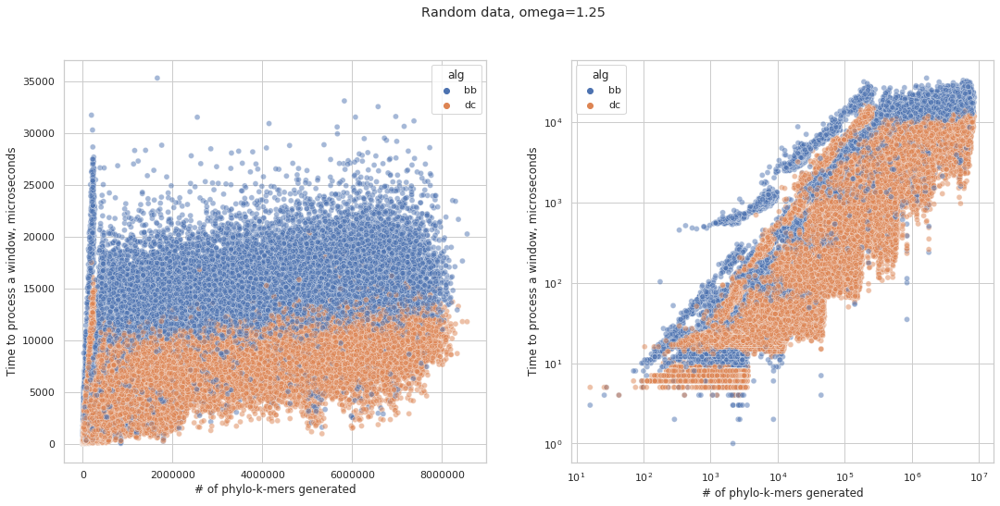

In [115]:
omega = 1.25
plot(df, omega, f"Random data, omega={omega}")

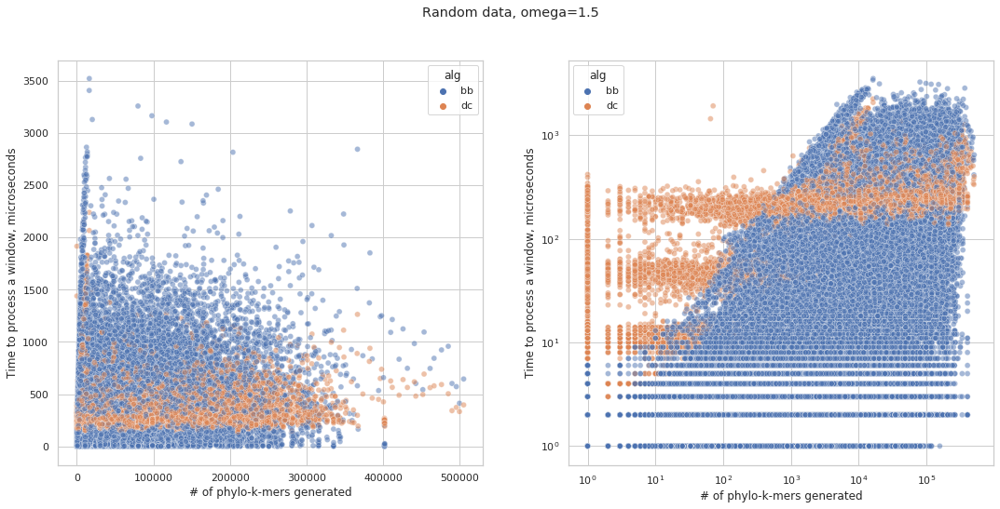

In [116]:
omega = 1.5
plot(df, omega, f"Random data, omega={omega}")

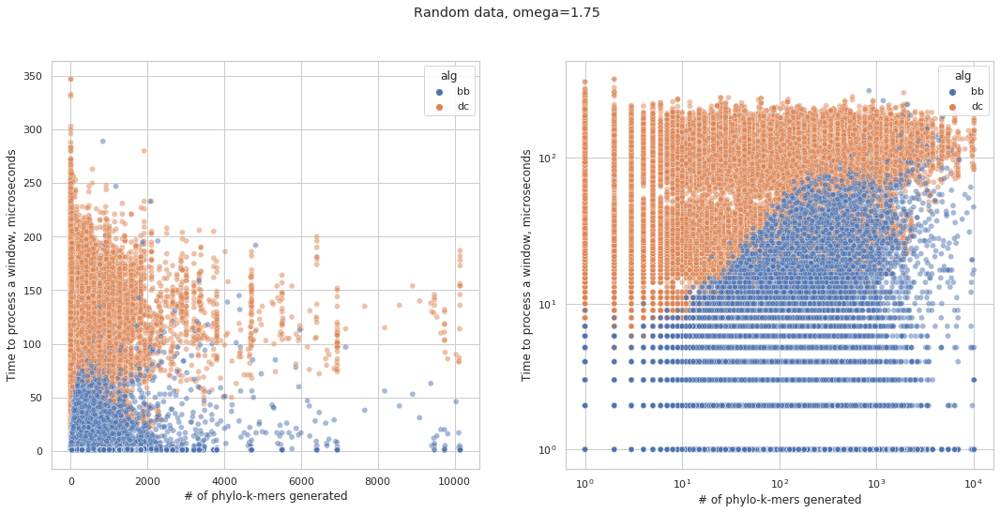

In [117]:
omega = 1.75
plot(df, omega, f"Random data, omega={omega}")

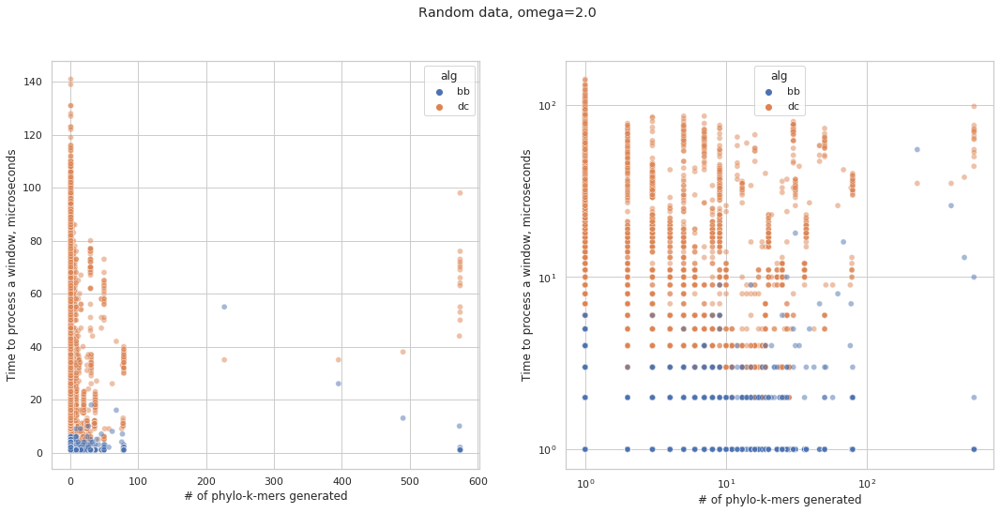

In [118]:
omega = 2.0
plot(df, omega, f"Random data, omega={omega}")

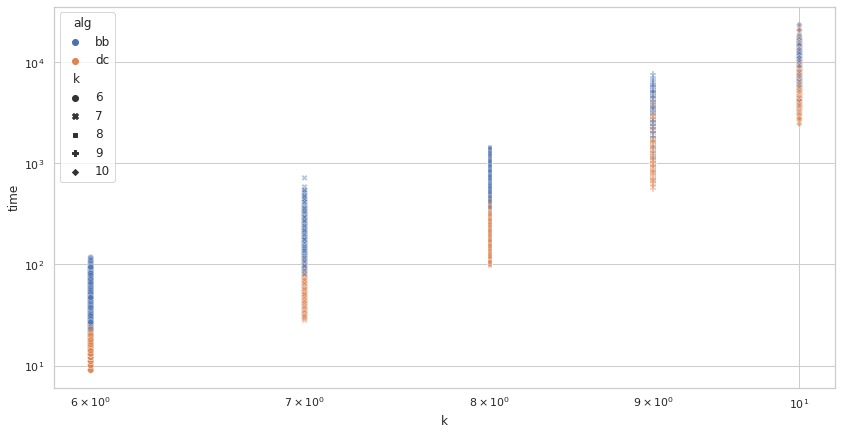

In [129]:
omega = 1.0
dfx = df[df.omega == omega]
g = sns.scatterplot(x="k", y="time", hue="alg", data=dfx, alpha=0.4, style='k')
g.set_yscale("log")
g.set_xscale("log")

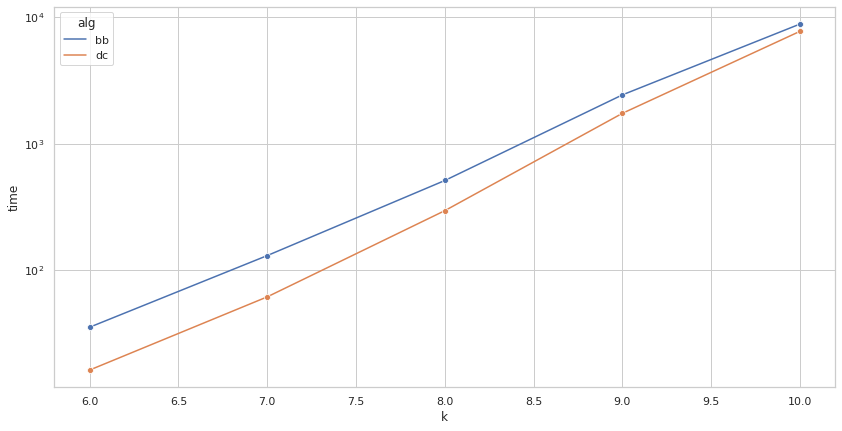

In [184]:
omega = 1.0
dfo = df[df.omega == omega]
dfg = dfo.groupby(['omega', 'k', 'alg']).mean().reset_index()
dfg["ratio"] = dfg["num_kmers"] / (4 ** dfg["k"])
g = sns.lineplot(data=dfg, x="k", y="time", hue="alg", marker='o')
g.set_yscale("log")
#g.set_xscale("log")

In [186]:
dfg

,omega,k,alg,num_kmers,time,ratio
0,1.0,6,bb,3593.737667,35.459417,0.877377
1,1.0,6,dc,3593.737667,16.270917,0.877377
2,1.0,7,bb,14409.926643,130.436786,0.879512
3,1.0,7,dc,14409.926643,61.557143,0.879512
4,1.0,8,bb,57835.279250,511.036500,0.882496
5,1.0,8,dc,57835.279250,295.214750,0.882496
6,1.0,9,bb,231879.193167,2424.874500,0.884549
7,1.0,9,dc,231879.193444,1733.708056,0.884549
8,1.0,10,bb,925832.174200,8793.071950,0.882942
9,1.0,10,dc,925832.174750,7702.751300,0.882942


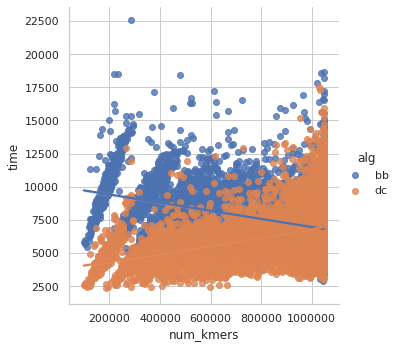

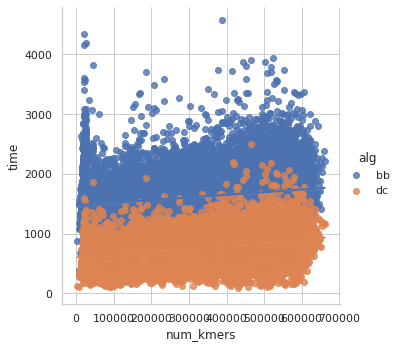

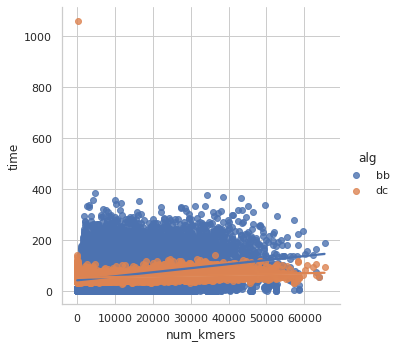

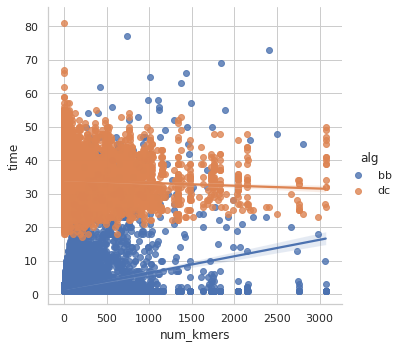

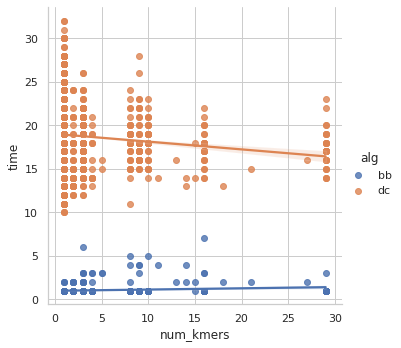

In [112]:
omega_values = df.omega.unique()
#fig, ax = plt.subplots(ncols=len(omega_values))
plots = []

#fig.set_size_inches(18, 8)
for i, omega in enumerate(omega_values):
    #omega = 1.5
    dfo = df[df['omega'] == omega]
    dfg = dfo.groupby(['num_kmers', 'k', 'alg']).mean()
    #plots.append(sns.jointplot(data=dfg, x="num_kmers", y="time", hue="alg"))
    #sns.jointplot(data=dfg, x="num_kmers", y="time", hue="alg")
    
    #sns.lmplot(data=dfo, x="num_kmers", y="time", hue="alg", scatter=False)
    sns.lmplot(data=dfo, x="num_kmers", y="time", hue="alg", scatter=True)

                          
#g0 = 

In [99]:
dfg

time  omega
num_kmers k  alg                    
98570     10 bb   6101.000000    1.0
             dc   3116.000000    1.0
109983    10 bb   5336.000000    1.0
             dc   2351.000000    1.0
118469    10 bb   5756.000000    1.0
...                       ...    ...
1048575   10 dc   7139.000000    1.0
1048576   10 bb   7401.000000    1.0
             dc   7203.750000    1.0
1048577   10 bb   6831.666667    1.0
             dc   6403.000000    1.0

[13796 rows x 2 columns]

# Playground

## Ignore things below

In [212]:
red = "#e7314b"
cyan = "#4bC2BC"
yellow = "#F2C400"
green = "#56B067"
blue = "#3395CD"
violet = "#8C5B9C"
dark_blue = "#31485f"
white = "#ffffff"

In [213]:
dfx = df.copy()
dfx["logtime"] = np.log10(dfx.time)
dfb = dfx[dfx["alg"] == "bb"]
dfc = dfx[dfx["alg"] == "dc"]
dfb.head()

,alg,num_kmers,time,k,omega,logtime
0,bb,999,98,6,1.0,1.991226
2,bb,1072,91,6,1.0,1.959041
4,bb,1242,113,6,1.0,2.053078
6,bb,1252,121,6,1.0,2.082785
8,bb,1271,110,6,1.0,2.041393


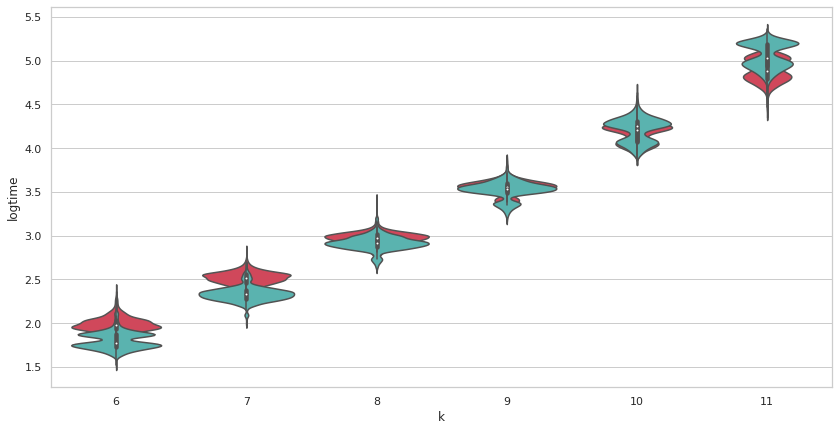

In [215]:
omega = 1.0
d1 = dfb[dfb["omega"] == omega]
d2 = dfc[dfc["omega"] == omega]
sns.violinplot(data=d1, x="k", y="logtime", color=red)
sns.violinplot(data=d2, x="k", y="logtime", color=cyan)

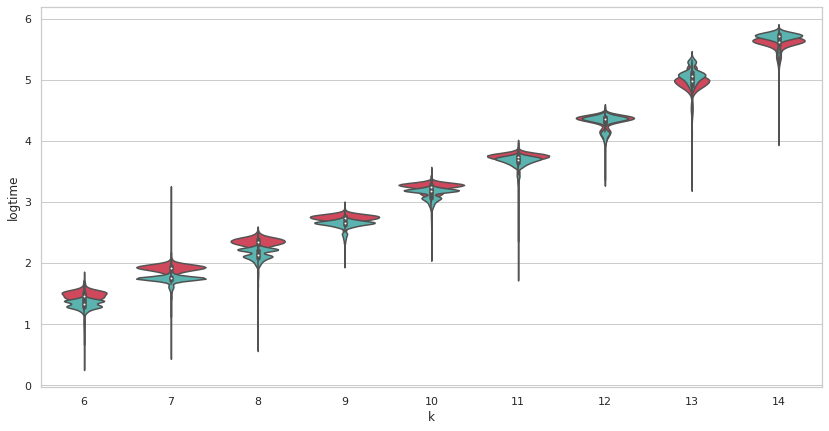

In [217]:
omega = 1.25
d1 = dfb[dfb["omega"] == omega]
d2 = dfc[dfc["omega"] == omega]
sns.violinplot(data=d1, x="k", y="logtime", color=red)
sns.violinplot(data=d2, x="k", y="logtime", color=cyan)

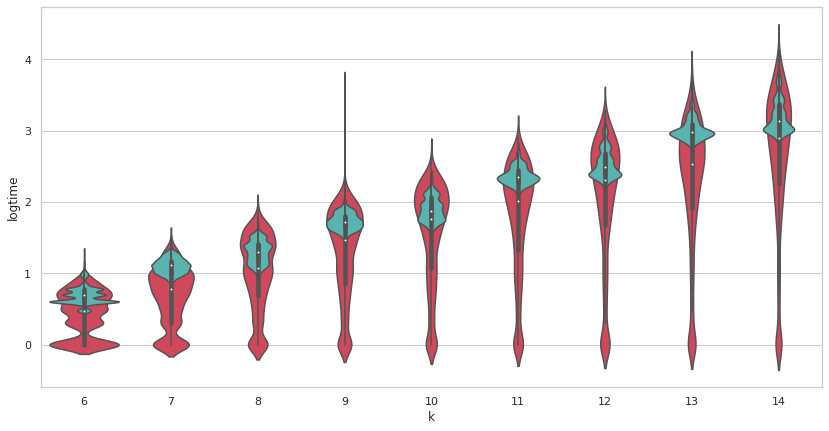

In [216]:
omega = 1.5
d1 = dfb[dfb["omega"] == omega]
d2 = dfc[dfc["omega"] == omega]
sns.violinplot(data=d1, x="k", y="logtime", color=red)
sns.violinplot(data=d2, x="k", y="logtime", color=cyan)

In [252]:
df.head()

,alg,num_kmers,time,k,omega
0,bb,999,98,6,1.0
1,dc,999,81,6,1.0
2,bb,1072,91,6,1.0
3,dc,1072,67,6,1.0
4,bb,1242,113,6,1.0


In [253]:
df = pd.read_csv("results/stats.csv")
df["time"] += 1
df["num_kmers"] += 1

In [264]:
dfx = df[df["k"] == 13]
dfx = dfx[dfx["omega"] == 1.5]
dfx.head()

,alg,num_kmers,time,k,omega
16500,bb,4163,876,13,1.5
16501,dc,4163,953,13,1.5
16502,rappas,4163,37477,13,1.5
16503,bb,1744,570,13,1.5
16504,dc,1744,899,13,1.5


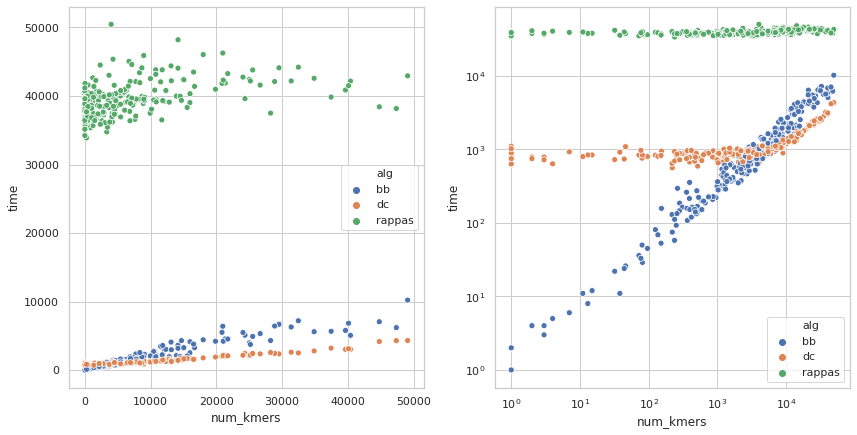

In [265]:
fig, axs = plt.subplots(ncols=2)
g1 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[0])
g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[1])
g2.set_yscale("log")
g2.set_xscale("log")

In [269]:
df = pd.read_csv("results/neotrop-random-10.csv")
df["time"] += 1
df["num_kmers"] += 1

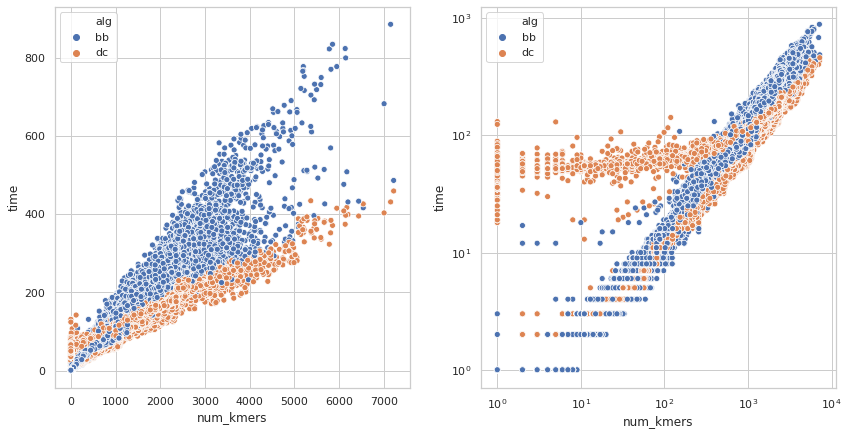

In [270]:
dfx = df[df["k"] == 10]
dfx = dfx[dfx["omega"] == 1.5]
dfx.head()

fig, axs = plt.subplots(ncols=2)
g1 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[0])
g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[1])
g2.set_yscale("log")
g2.set_xscale("log")

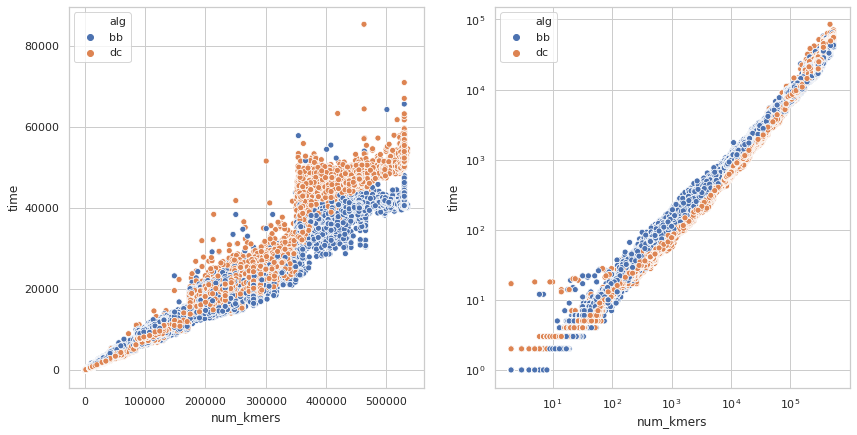

In [271]:
dfx = df[df["k"] == 10]
dfx = dfx[dfx["omega"] == 1.0]
dfx.head()

fig, axs = plt.subplots(ncols=2)
g1 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[0])
g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[1])
g2.set_yscale("log")
g2.set_xscale("log")

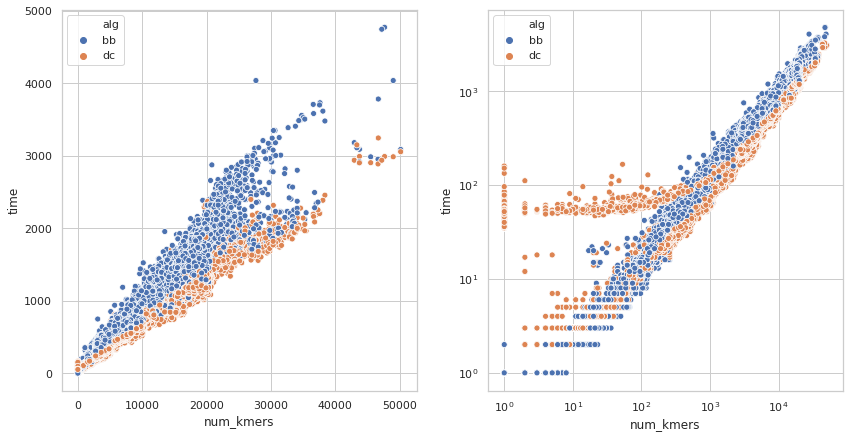

In [272]:
dfx = df[df["k"] == 10]
dfx = dfx[dfx["omega"] == 1.25]
dfx.head()

fig, axs = plt.subplots(ncols=2)
g1 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[0])
g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx, ax=axs[1])
g2.set_yscale("log")
g2.set_xscale("log")

In [334]:
df = pd.read_csv("results/stats.csv")
df["time"] += 1
df["num_kmers"] += 1

In [333]:
df = pd.read_csv("results/neotrop-random-10.csv")
df["time"] += 1
df["num_kmers"] += 1

In [325]:
import math
def f(omega, k_values):
    for k in k_values:
        dfz = df.copy()
        dfz = dfz[dfz["alg"] == "bb"]
        dfz = dfz[dfz["omega"] == omega]
        dfz = dfz[dfz["k"] == k]

        print("TH\t#kmers\tratio")
        xx = dfz.num_kmers
        y = []
        for x in xx:
            #th = (omega / 4.0) ** k
            y.append(x / (4.0**k))

        dy = np.array(y)
        plt.hist(dy)
        plt.title(f"k = {k}, omega={omega}")

TH	#kmers	ratio


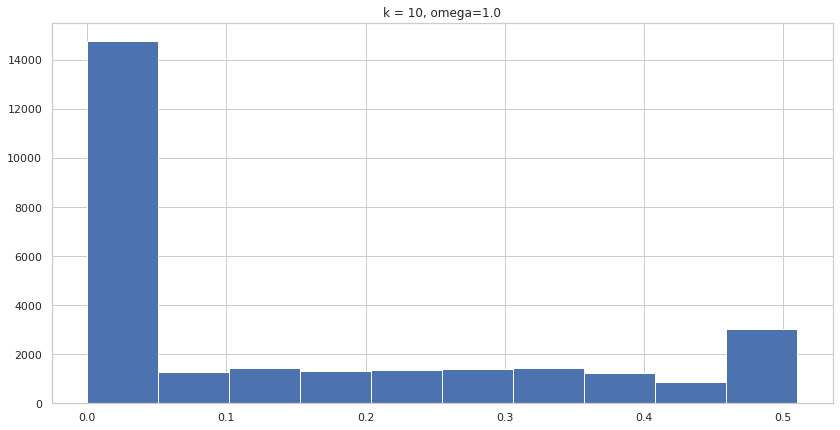

In [326]:
        
f(1.0, [10])

TH	#kmers	ratio


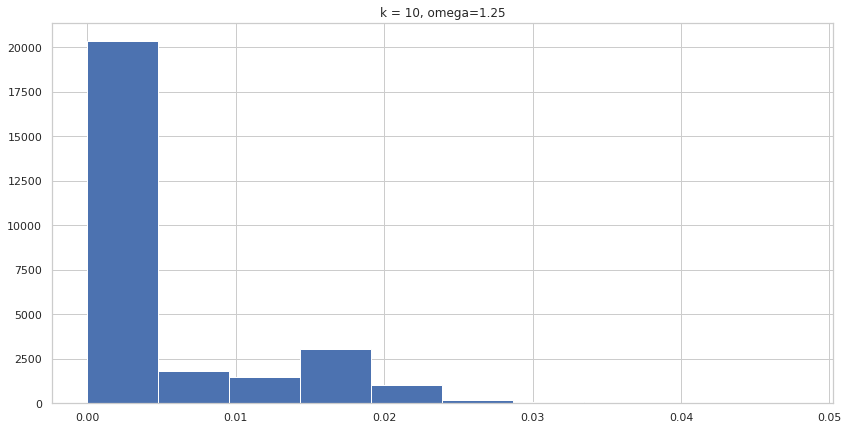

In [327]:
#f(1.25, [6, 7, 8, 9, 10, 11])
        
f(1.25, [10])

TH	#kmers	ratio


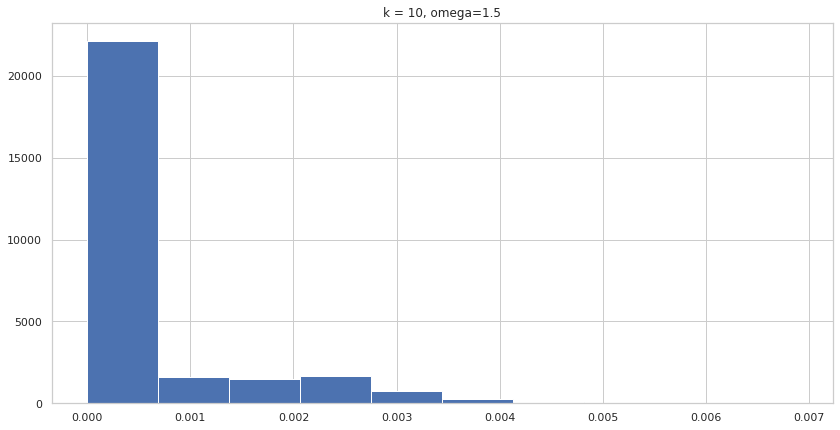

In [328]:
f(1.5, [10])

TH	#kmers	ratio
TH	#kmers	ratio


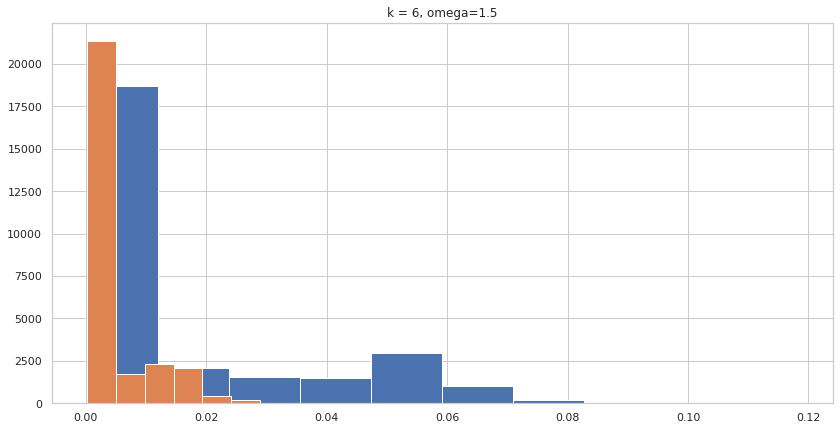

In [331]:
for omega in [1.25, 1.5]:        
    f(omega, [6])

TH	#kmers	ratio
TH	#kmers	ratio


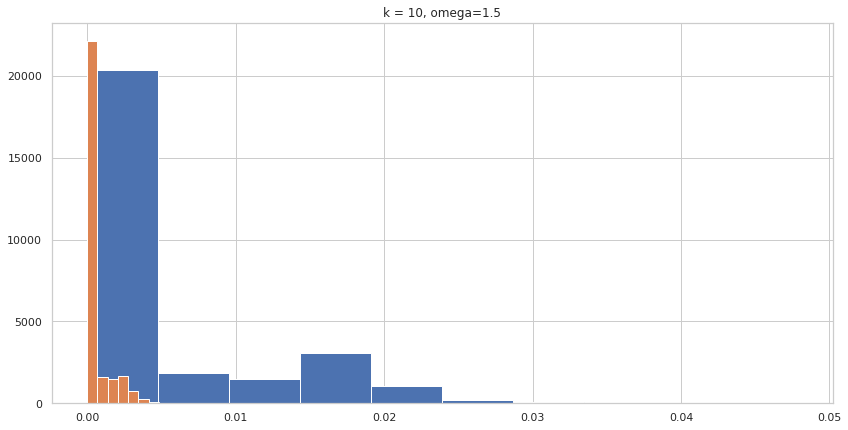

In [332]:
for omega in [1.25, 1.5]:        
    f(omega, [10])

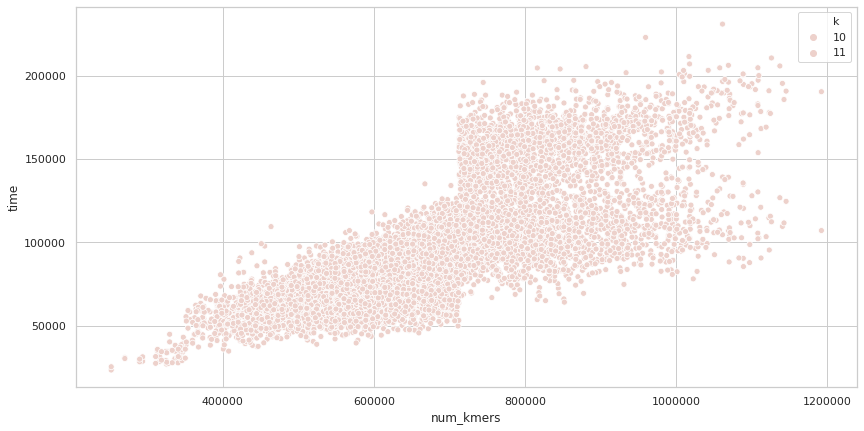

In [378]:
df = pd.read_csv("results/random.csv")
df["time"] += 1
df["num_kmers"] += 1
dfx = df.copy()
dfx = dfx[dfx["omega"]  == 1.0]
dfx = dfx[dfx["k"]  == 11]
sns.scatterplot(x="num_kmers", y="time", hue="k", data=dfx)

In [374]:
dfx[dfx["k"] == 12]

,alg,num_kmers,time,k,omega


In [377]:
dfx.k.unique()

array([ 6,  7,  8,  9, 10, 11])

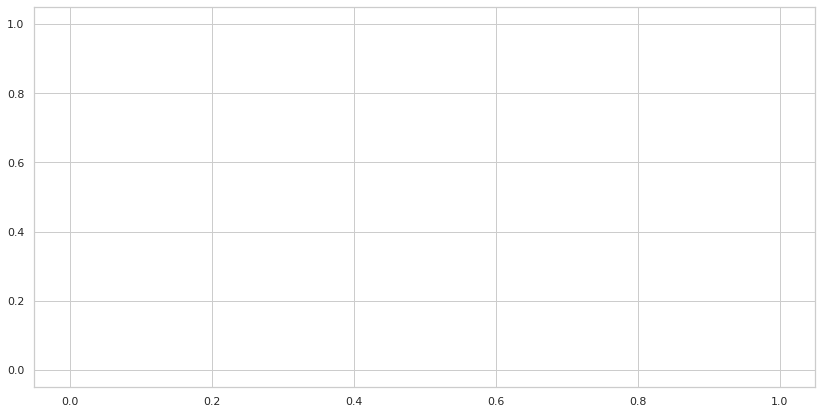

In [388]:
df = pd.read_csv("results/neotrop-random-10.csv")
df["time"] += 1
df["num_kmers"] += 1

k = 11
omega = 1.0

dfx = df.copy()
dfx = dfx[dfx["k"] == k]
dfx = dfx[dfx["omega"] == omega]

#plot(dfx, omega, f"Neotrop-10, omega={omega}", True)


sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx)


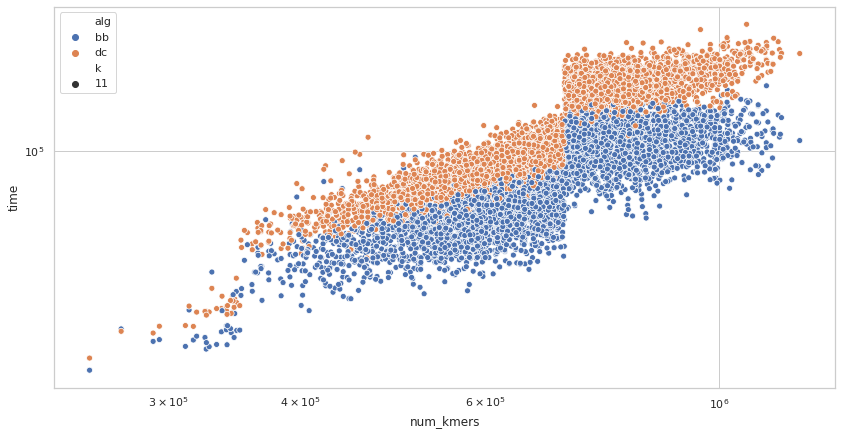

In [384]:
g2 = sns.scatterplot(x="num_kmers", y="time", hue="alg", data=dfx)
g2.set_yscale("log")
g2.set_xscale("log")

In [17]:
df = pd.read_csv("results/random.csv")
df["time"] += 1
df["num_kmers"] += 1

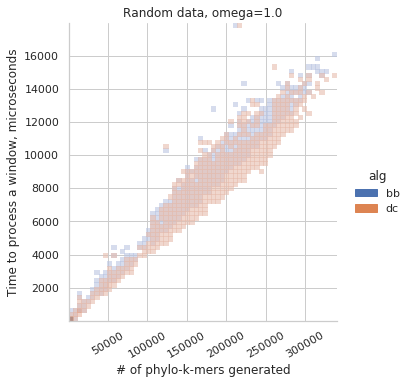

In [44]:
kde(df, 1.0, "Random data, omega=1.0")

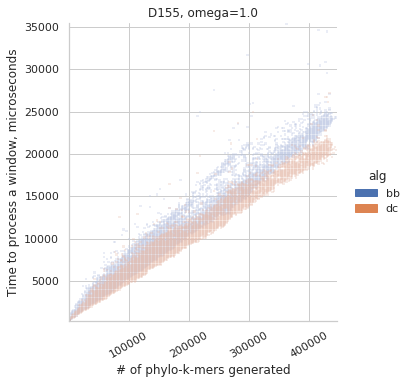

In [86]:
def kde_all(df, title, stylek=False):
    omega_values = df.omega.unique()
    ncols = 2
    nrows = int(len(omega_values) / 2)
    fig, axs = plt.subplots(len(omega_values))
    
    size = 6
    #fig.set_size_inches(len(omega_values)*size, size)
    fig.set_size_inches(size, len(omega_values)*size)
    
    for i, omega in enumerate(omega_values):
        dfx = df[df["omega"] == omega]
        g = sns.histplot(x="num_kmers", y="time", hue="alg", data=dfx, alpha=0.5, ax=axs[i])

        plt.title(title + f", omega={omega}")
        xlabel = "# of phylo-k-mers generated"
        ylabel = "Time to process a window, microseconds"
        g.set_xticklabels(g.get_xticklabels(), rotation=30)
        g.set_xlabel(xlabel)
        #g.set_ylabel(ylabel)

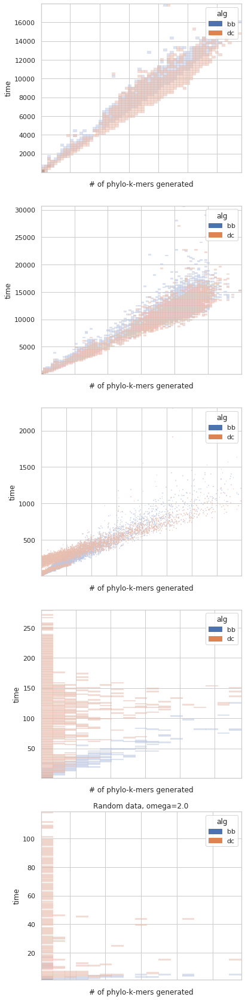

In [87]:
kde_all(df, "Random data")

In [115]:
df = pd.read_csv("results/dc-prefixes.csv")
df["time"] += 1
df["num_kmers"] += 1

In [109]:
#kde_all(df, "Random data, DC no join")

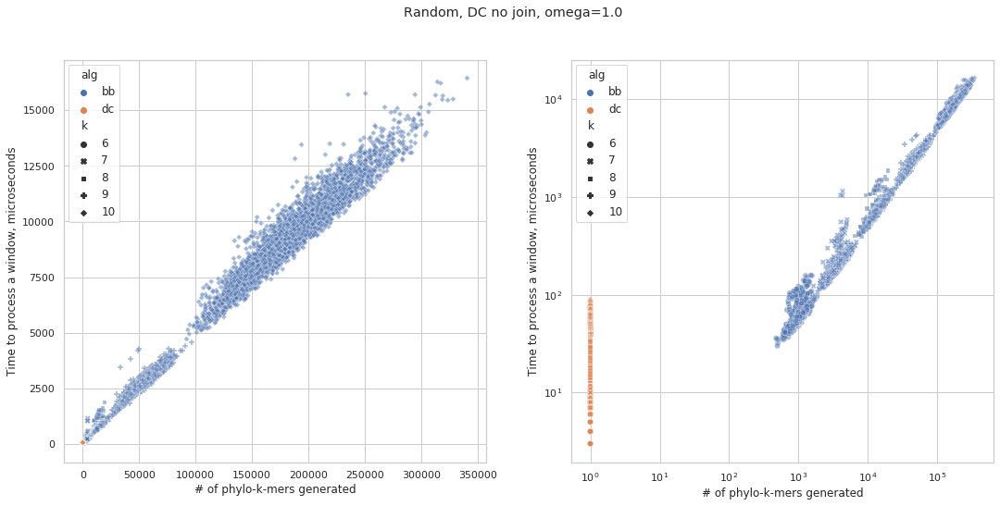

In [117]:
omega = 1.0
plot(df, omega, f"Random, DC no join, omega={omega}", True)

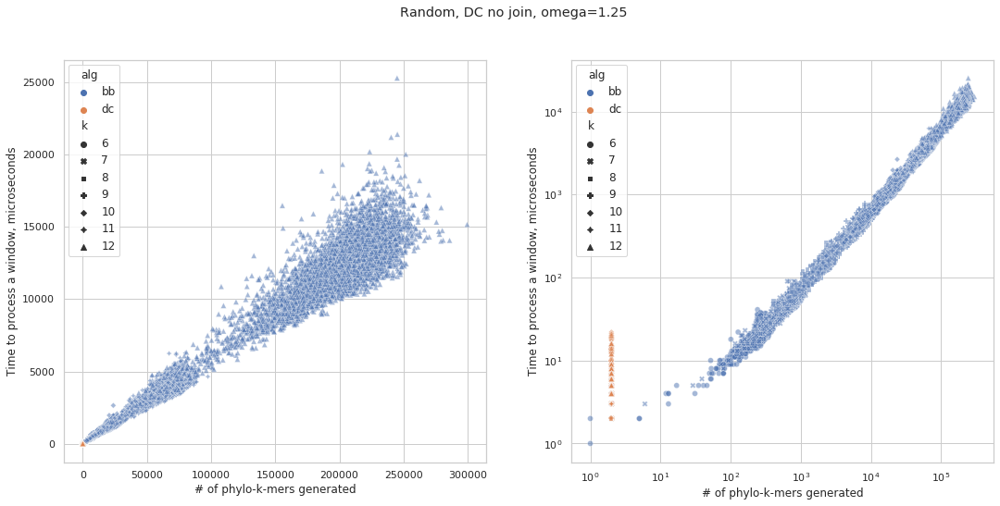

In [111]:
omega = 1.25
plot(df, omega, f"Random, DC no join, omega={omega}", True)

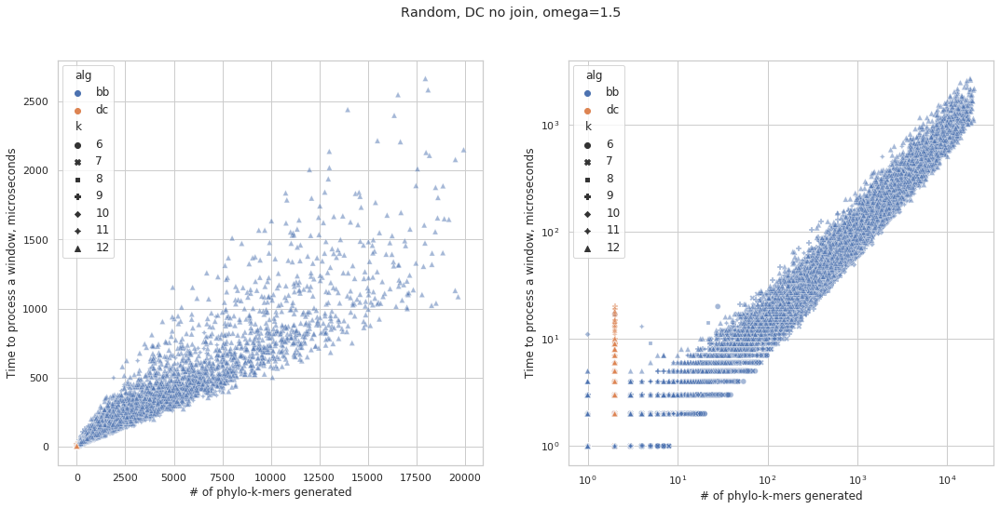

In [112]:
omega = 1.5
plot(df, omega, f"Random, DC no join, omega={omega}", True)

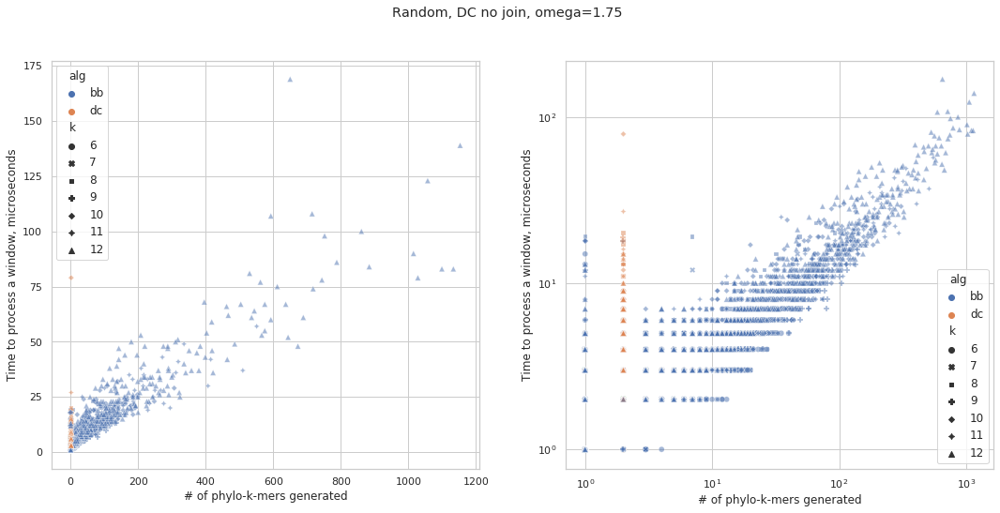

In [113]:
omega = 1.75
plot(df, omega, f"Random, DC no join, omega={omega}", True)

In [315]:
import tqdm

ks = []
o = []
gs = []
zs = []
ret_mean = []

with open('returns.txt') as f:
    for line in tqdm.tqdm(f.readlines(), position=0, leave=True):
        k, omega, stats = line.split(',')
        
        # all returns for that window
        z = [int(c) for c in stats[:-1]]
        
        # returns of good k-mers
        good = z.count(1)
        
        # the number of other returns between two good ones
        ret_stats = []
        count = 0
        for x in z:
            if x != 1:
                count += 1
            else:
                ret_stats.append(count)
                count = 0
                
        # average number of returns between two good k-mers
        ret_mean_value = np.array(ret_stats).mean()
        
        ks.append(int(k))
        o.append(float(omega))
        gs.append(good)
        zs.append(len(z))
        ret_mean.append(ret_mean_value)

100%|██████████| 116800/116800 [28:10<00:00, 69.11it/s]  


In [188]:
len(ks), len(o), len(gs), len(zs), len(ret_mean)

(16000, 16000, 16000, 16000, 16000)

In [287]:
df = pd.DataFrame(data={
    'k': ks, 'omega': o, 'good': gs, 'z': zs, 'ret_mean': ret_mean
})

In [288]:
# the ratio of good returns
df["ratio"] = df.good / df.z

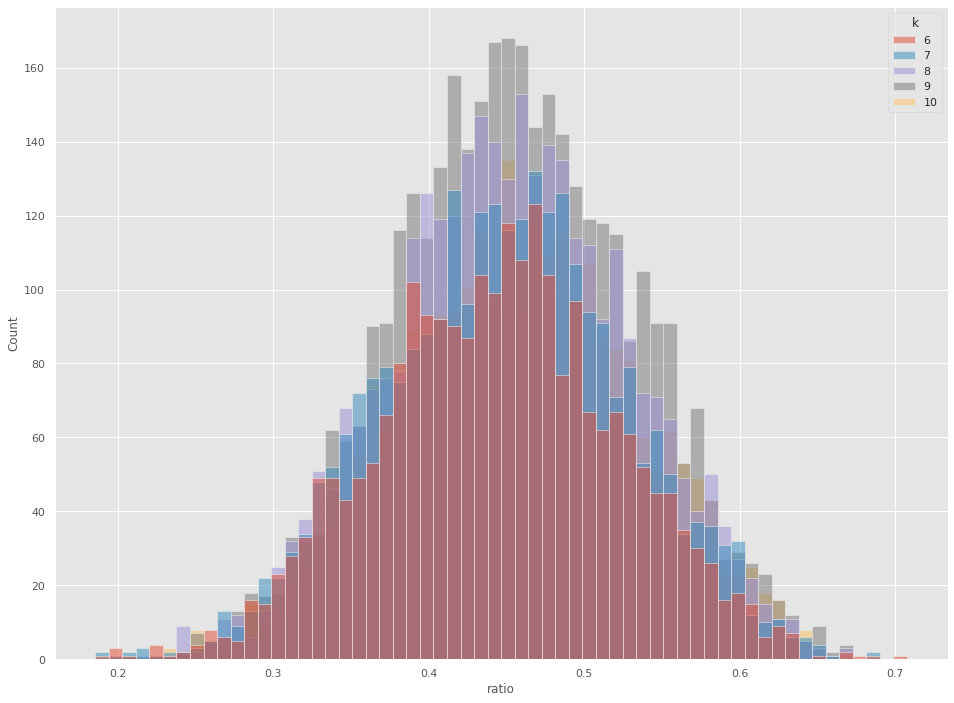

In [289]:
sns.histplot(data=df, x="ratio", hue="k")

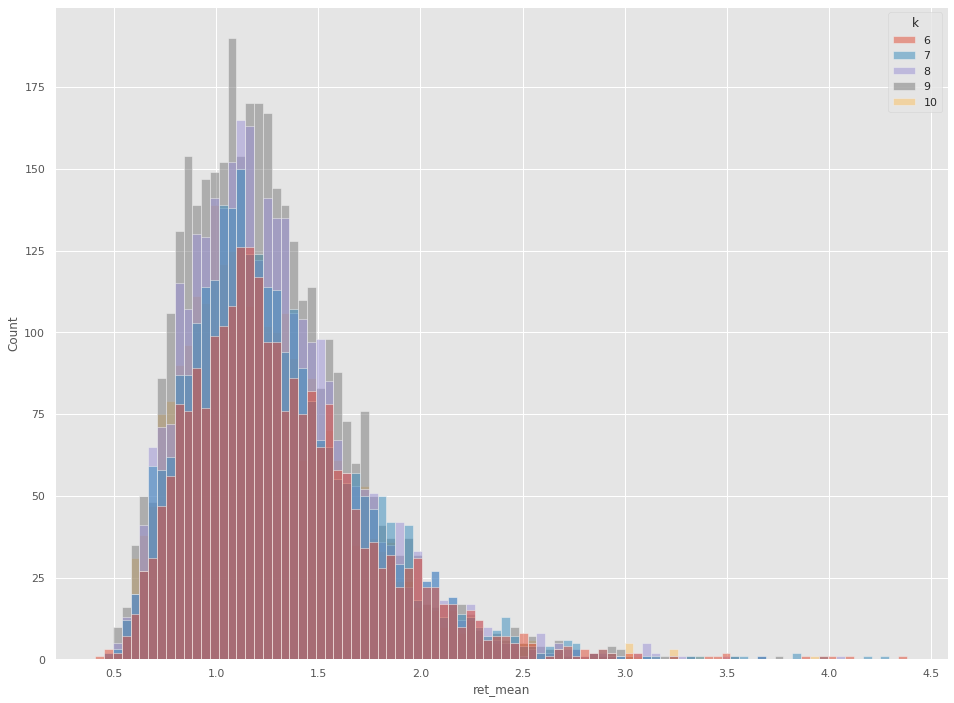

In [290]:
sns.histplot(data=df, x="ret_mean", hue="k")

In [293]:
df.k.unique()

array(['6', '7', '8', '9', '10'], dtype=object)

In [296]:
df10 = df[df["k"] == '10']
df10

,k,omega,good,z,ret_mean,ratio
12000,10,1,215000,548348,1.550381,0.392087
12001,10,1,198224,562620,1.838228,0.352323
12002,10,1,197084,403412,1.046818,0.488543
12003,10,1,211377,376880,0.782904,0.560860
12004,10,1,222999,417568,0.872443,0.534042
...,...,...,...,...,...,...
14623,10,1,238018,505344,1.123096,0.471002
14624,10,1,249326,495672,0.988012,0.503006
14625,10,1,266529,426140,0.598817,0.625449
14626,10,1,215480,617228,1.864391,0.349109


In [297]:
data = df10["ret_mean"]
data

12000    1.550381
12001    1.838228
12002    1.046818
12003    0.782904
12004    0.872443
           ...   
14623    1.123096
14624    0.988012
14625    0.598817
14626    1.864391
14627    1.055120
Name: ret_mean, Length: 2628, dtype: float64

  1 / 98 : ksone
  2 / 98 : kstwobign
  3 / 98 : norm
  4 / 98 : alpha
  5 / 98 : anglit
  6 / 98 : arcsine
  7 / 98 : beta
  8 / 98 : betaprime
  9 / 98 : bradford
 10 / 98 : burr
 11 / 98 : burr12
 12 / 98 : fisk
 13 / 98 : cauchy
 14 / 98 : chi
 15 / 98 : chi2
 16 / 98 : cosine
 17 / 98 : dgamma
 18 / 98 : dweibull
 19 / 98 : expon
 20 / 98 : exponnorm
 21 / 98 : exponweib
 22 / 98 : exponpow
 23 / 98 : fatiguelife
 24 / 98 : foldcauchy
 25 / 98 : f
 26 / 98 : foldnorm
 27 / 98 : weibull_min
 28 / 98 : weibull_max
 29 / 98 : frechet_r
 30 / 98 : frechet_l
 31 / 98 : genlogistic
 32 / 98 : genpareto
 33 / 98 : genexpon
 34 / 98 : genextreme
 35 / 98 : gamma
 36 / 98 : erlang
 37 / 98 : gengamma
 38 / 98 : genhalflogistic
 39 / 98 : gompertz
 40 / 98 : gumbel_r
 41 / 98 : gumbel_l
 42 / 98 : halfcauchy
 43 / 98 : halflogistic
 44 / 98 : halfnorm
 45 / 98 : hypsecant
 46 / 98 : gausshyper
 47 / 98 : invgamma
 48 / 98 : invgauss
 49 / 98 : norminvgauss
 50 / 98 : invweibull
 51 / 98 : j

Text(0, 0.5, 'Frequency')

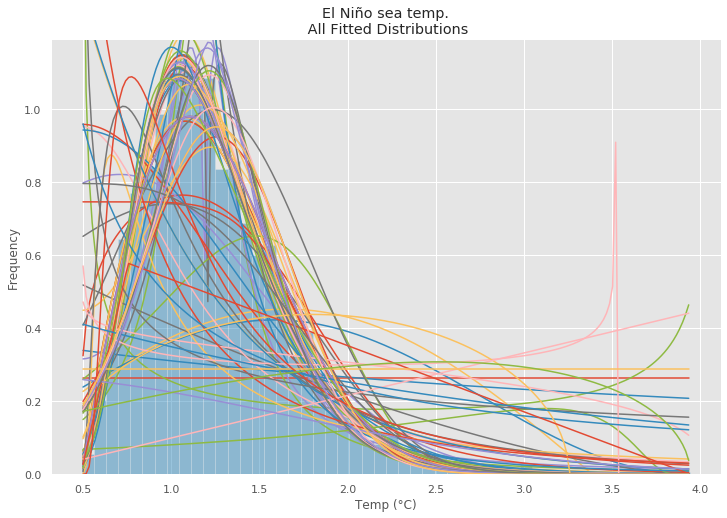

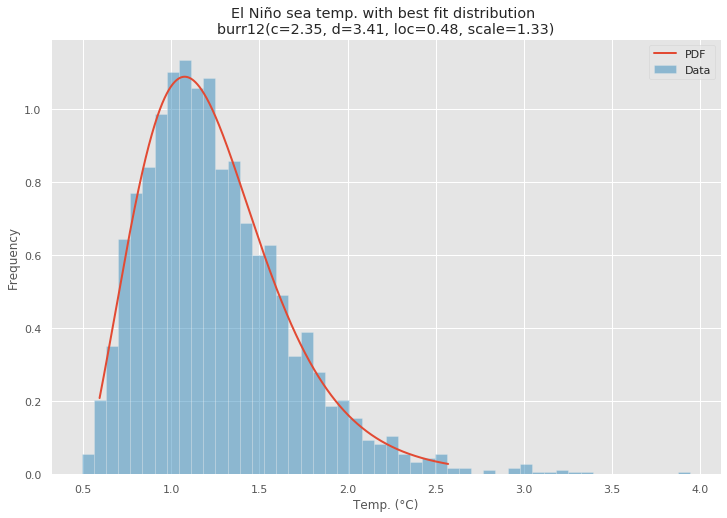

In [298]:
# https://stackoverflow.com/questions/6620471/fitting-empirical-distribution-to-theoretical-ones-with-scipy-python

import warnings
import numpy as np
import pandas as pd
import scipy.stats as st
import statsmodels.api as sm
from scipy.stats._continuous_distns import _distn_names
import matplotlib
import matplotlib.pyplot as plt

matplotlib.rcParams['figure.figsize'] = (16.0, 12.0)
matplotlib.style.use('ggplot')

# Create models from data
def best_fit_distribution(data, bins=200, ax=None):
    """Model data by finding best fit distribution to data"""
    # Get histogram of original data
    y, x = np.histogram(data, bins=bins, density=True)
    x = (x + np.roll(x, -1))[:-1] / 2.0

    # Best holders
    best_distributions = []

    # Estimate distribution parameters from data
    for ii, distribution in enumerate([d for d in _distn_names if not d in ['levy_stable', 'studentized_range']]):

        print("{:>3} / {:<3}: {}".format( ii+1, len(_distn_names), distribution ))

        distribution = getattr(st, distribution)

        # Try to fit the distribution
        try:
            # Ignore warnings from data that can't be fit
            with warnings.catch_warnings():
                warnings.filterwarnings('ignore')
                
                # fit dist to data
                params = distribution.fit(data)

                # Separate parts of parameters
                arg = params[:-2]
                loc = params[-2]
                scale = params[-1]
                
                # Calculate fitted PDF and error with fit in distribution
                pdf = distribution.pdf(x, loc=loc, scale=scale, *arg)
                sse = np.sum(np.power(y - pdf, 2.0))
                
                # if axis pass in add to plot
                try:
                    if ax:
                        pd.Series(pdf, x).plot(ax=ax)
                    end
                except Exception:
                    pass

                # identify if this distribution is better
                best_distributions.append((distribution, params, sse))
        
        except Exception:
            pass

    
    return sorted(best_distributions, key=lambda x:x[2])

def make_pdf(dist, params, size=10000):
    """Generate distributions's Probability Distribution Function """

    # Separate parts of parameters
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]

    # Get sane start and end points of distribution
    start = dist.ppf(0.01, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.01, loc=loc, scale=scale)
    end = dist.ppf(0.99, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.99, loc=loc, scale=scale)

    # Build PDF and turn into pandas Series
    x = np.linspace(start, end, size)
    y = dist.pdf(x, loc=loc, scale=scale, *arg)
    pdf = pd.Series(y, x)

    return pdf

# Load data from statsmodels datasets
#data = pd.Series(sm.datasets.elnino.load_pandas().data.set_index('YEAR').values.ravel())
#data = df.ret_mean

# Plot for comparison
plt.figure(figsize=(12,8))
ax = data.plot(kind='hist', bins=50, density=True, alpha=0.5, color=list(matplotlib.rcParams['axes.prop_cycle'])[1]['color'])

# Save plot limits
dataYLim = ax.get_ylim()

# Find best fit distribution
best_distibutions = best_fit_distribution(data, 200, ax)
best_dist = best_distibutions[0]

# Update plots
ax.set_ylim(dataYLim)
ax.set_title(u'El Niño sea temp.\n All Fitted Distributions')
ax.set_xlabel(u'Temp (°C)')
ax.set_ylabel('Frequency')

# Make PDF with best params 
pdf = make_pdf(best_dist[0], best_dist[1])

# Display
plt.figure(figsize=(12,8))
ax = pdf.plot(lw=2, label='PDF', legend=True)
data.plot(kind='hist', bins=50, density=True, alpha=0.5, label='Data', legend=True, ax=ax)

param_names = (best_dist[0].shapes + ', loc, scale').split(', ') if best_dist[0].shapes else ['loc', 'scale']
param_str = ', '.join(['{}={:0.2f}'.format(k,v) for k,v in zip(param_names, best_dist[1])])
dist_str = '{}({})'.format(best_dist[0].name, param_str)

ax.set_title(u'El Niño sea temp. with best fit distribution \n' + dist_str)
ax.set_xlabel(u'Temp. (°C)')
ax.set_ylabel('Frequency')

In [299]:
from distfit import distfit

dist = distfit()
dist.fit_transform(data)

[distfit] >fit..
[distfit] >transform..
[distfit] >[norm      ] [0.00 sec] [RSS: 0.6526712] [loc=1.255 scale=0.419]
[distfit] >[expon     ] [0.00 sec] [RSS: 4.7152257] [loc=0.491 scale=0.764]
[distfit] >[pareto    ] [0.04 sec] [RSS: 7.1949124] [loc=-0.408 scale=0.899]
[distfit] >[dweibull  ] [0.02 sec] [RSS: 0.5021895] [loc=1.208 scale=0.337]
[distfit] >[t         ] [0.05 sec] [RSS: 0.4560159] [loc=1.215 scale=0.347]
[distfit] >[genextreme] [0.06 sec] [RSS: 0.0745910] [loc=1.063 scale=0.320]
[distfit] >[gamma     ] [0.03 sec] [RSS: 0.0613680] [loc=0.446 scale=0.215]
[distfit] >[lognorm   ] [0.03 sec] [RSS: 0.0663738] [loc=0.180 scale=1.001]
[distfit] >[beta      ] [0.10 sec] [RSS: 0.0760168] [loc=0.295 scale=1217264301541.908]
[distfit] >[uniform   ] [0.00 sec] [RSS: 6.8543619] [loc=0.491 scale=3.453]
[distfit] >[loggamma  ] [0.08 sec] [RSS: 0.6990732] [loc=-131.761 scale=17.861]
[distfit] >Compute confidence interval [parametric]


{'model': {'distr': <scipy.stats._continuous_distns.gamma_gen at 0x7f8132c4e610>,
  'stats': 'RSS',
  'params': (3.769738040013445, 0.44631662011429285, 0.21460990087109522),
  'name': 'gamma',
  'model': <scipy.stats._distn_infrastructure.rv_frozen at 0x7f7e5c8b5290>,
  'score': 0.06136797232532707,
  'loc': 0.44631662011429285,
  'scale': 0.21460990087109522,
  'arg': (3.769738040013445,),
  'CII_min_alpha': 0.7112104017990364,
  'CII_max_alpha': 2.03957829425845},
 'summary':          distr      score  LLE       loc        scale  \
 0        gamma   0.061368  NaN  0.446317      0.21461   
 1      lognorm  0.0663738  NaN  0.179765      1.00132   
 2   genextreme   0.074591  NaN   1.06339     0.320407   
 3         beta  0.0760168  NaN  0.294599  1.21726e+12   
 4            t   0.456016  NaN    1.2154     0.347122   
 5     dweibull    0.50219  NaN   1.20768     0.337356   
 6         norm   0.652671  NaN   1.25534     0.419024   
 7     loggamma   0.699073  NaN  -131.761      17.861

In [300]:
best_distr = dist.model
print(best_distr)

{'distr': <scipy.stats._continuous_distns.gamma_gen object at 0x7f8132c4e610>, 'stats': 'RSS', 'params': (3.769738040013445, 0.44631662011429285, 0.21460990087109522), 'name': 'gamma', 'model': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f7e5c8b5290>, 'score': 0.06136797232532707, 'loc': 0.44631662011429285, 'scale': 0.21460990087109522, 'arg': (3.769738040013445,), 'CII_min_alpha': 0.7112104017990364, 'CII_max_alpha': 2.03957829425845}


In [301]:
dist.summary

,distr,score,LLE,loc,scale,arg
0,gamma,0.061368,NaN,0.446317,0.21461,"(3.769738040013445,)"
1,lognorm,0.0663738,NaN,0.179765,1.00132,"(0.37908329687988596,)"
2,genextreme,0.074591,NaN,1.06339,0.320407,"(-0.02069092354797835,)"
3,beta,0.0760168,NaN,0.294599,1.21726e+12,"(6.017043753879426, 7672052453396.461)"
4,t,0.456016,NaN,1.2154,0.347122,"(6.471579286096512,)"
5,dweibull,0.50219,NaN,1.20768,0.337356,"(1.1814660489561954,)"
6,norm,0.652671,NaN,1.25534,0.419024,()
7,loggamma,0.699073,NaN,-131.761,17.8612,"(1715.507873205992,)"
8,expon,4.71523,NaN,0.49086,0.764479,()
9,uniform,6.85436,NaN,0.49086,3.45337,()


[distfit] >plot summary..


(<Figure size 1080x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f7e5dc0d890>)

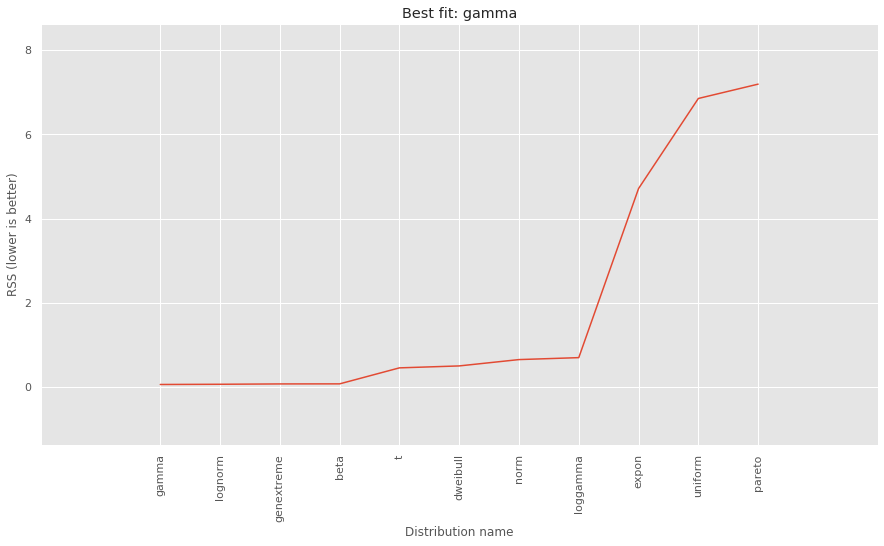

In [302]:
dist.plot_summary()

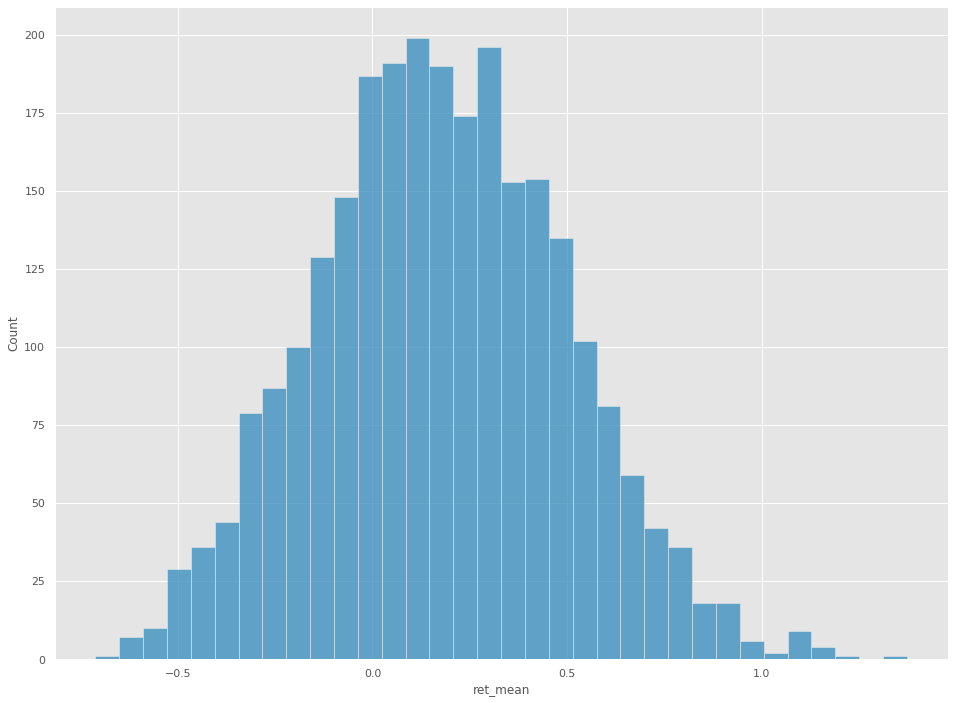

In [304]:
log_data = np.log(data)
sns.histplot(log_data)

In [305]:
st.shapiro(log_data)

(0.997759997844696, 0.0008257718291133642)

In [307]:
from scipy.stats import kstest

args = [best_distr["arg"], best_distr["loc"], best_distr["scale"]]
print(args)
kstest(data, 'gamma', args=args)

[(3.769738040013445,), 0.44631662011429285, 0.21460990087109522]


KstestResult(statistic=0.011788781267170895, pvalue=0.8584839413897786)

In [309]:
dist = distfit(distr="full")
dist.fit_transform(data)

[distfit] >fit..
[distfit] >transform..
[distfit] >[alpha          ] [0.04 sec] [RSS: 0.0768234] [loc=-0.889 scale=11.657]
[distfit] >[anglit         ] [0.01 sec] [RSS: 4.6565473] [loc=1.654 scale=2.209]
[distfit] >[arcsine        ] [0.05 sec] [RSS: 7.7280271] [loc=0.491 scale=3.581]
[distfit] >[beta           ] [0.10 sec] [RSS: 0.0760168] [loc=0.295 scale=1217264301541.908]
[distfit] >[betaprime      ] [0.13 sec] [RSS: 0.0622394] [loc=-0.120 scale=0.563]
[distfit] >[bradford       ] [0.03 sec] [RSS: 5.9134837] [loc=0.231 scale=3.714]
[distfit] >[burr           ] [0.20 sec] [RSS: 0.0719277] [loc=-30.960 scale=30.902]
[distfit] >[cauchy         ] [0.01 sec] [RSS: 0.9273871] [loc=1.160 scale=0.231]
[distfit] >[chi            ] [0.03 sec] [RSS: 0.1585249] [loc=0.488 scale=0.621]
[distfit] >[chi2           ] [0.03 sec] [RSS: 0.0613672] [loc=0.446 scale=0.107]
[distfit] >[cosine         ] [0.01 sec] [RSS: 4.5474322] [loc=1.583 scale=0.752]
[distfit] >[dgamma         ] [0.01 sec] [RSS: 0.401

{'model': {'distr': <scipy.stats._continuous_distns.powerlognorm_gen at 0x7f8132c26450>,
  'stats': 'RSS',
  'params': (15.5265864128279,
   0.971009240909407,
   0.4265095386448464,
   3.988259431186242),
  'name': 'powerlognorm',
  'model': <scipy.stats._distn_infrastructure.rv_frozen at 0x7f7e5ccabdd0>,
  'score': 0.05847078985660577,
  'loc': 0.4265095386448464,
  'scale': 3.988259431186242,
  'arg': (15.5265864128279, 0.971009240909407),
  'CII_min_alpha': 0.7117398880175845,
  'CII_max_alpha': 2.0387585249867706},
 'summary':            distr        score  LLE       loc        scale  \
 0   powerlognorm    0.0584708  NaN   0.42651      3.98826   
 1              f    0.0609998  NaN  0.427351     0.815583   
 2           chi2    0.0613672  NaN  0.446318     0.107304   
 3          gamma     0.061368  NaN  0.446317      0.21461   
 4         erlang    0.0613684  NaN  0.446319      0.21461   
 ..           ...          ...  ...       ...          ...   
 75        pareto      7.1949

In [311]:
dist.model

{'distr': <scipy.stats._continuous_distns.powerlognorm_gen at 0x7f8132c26450>,
 'stats': 'RSS',
 'params': (15.5265864128279,
  0.971009240909407,
  0.4265095386448464,
  3.988259431186242),
 'name': 'powerlognorm',
 'model': <scipy.stats._distn_infrastructure.rv_frozen at 0x7f7e5ccabdd0>,
 'score': 0.05847078985660577,
 'loc': 0.4265095386448464,
 'scale': 3.988259431186242,
 'arg': (15.5265864128279, 0.971009240909407),
 'CII_min_alpha': 0.7117398880175845,
 'CII_max_alpha': 2.0387585249867706}

In [314]:
args = [*dist.model["arg"], dist.model["loc"], dist.model["scale"]]
print(args)
kstest(data, 'powerlognorm', args=args)

[15.5265864128279, 0.971009240909407, 0.4265095386448464, 3.988259431186242]


KstestResult(statistic=0.0104774762470351, pvalue=0.9351612199486466)